In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_row',None)
pd.set_option('display.max_columns',None)

In [3]:
df_flat = pd.read_excel('flats.xlsx')
df_flat.head()

,property_name,link,society,price,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating,property_id
0,2 BHK Flat in Krishna Colony,https://www.99acres.com/2-bhk-bedroom-apartmen...,maa bhagwati residency,45 Lac,"₹ 5,000/sq.ft.",Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ...",C68850746
1,2 BHK Flat in Ashok Vihar,https://www.99acres.com/2-bhk-bedroom-apartmen...,Apna Enclave,50 Lac,"₹ 7,692/sq.ft.",Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ...",H68850564
2,2 BHK Flat in Sohna,https://www.99acres.com/2-bhk-bedroom-apartmen...,Tulsiani Easy in Homes,40 Lac,"₹ 6,722/sq.ft.",Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ...",J68850120
3,2 BHK Flat in Sector 61 Gurgaon,https://www.99acres.com/2-bhk-bedroom-apartmen...,Smart World Orchard,1.47 Crore,"₹ 12,250/sq.ft.",Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN,S68849476
4,2 BHK Flat in Sector 92 Gurgaon,https://www.99acres.com/2-bhk-bedroom-apartmen...,Parkwood Westend,70 Lac,"₹ 5,204/sq.ft.",Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ...",L47956793


In [4]:
df_flat.shape

(3027, 20)

In [5]:
df_flat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3027 entries, 0 to 3026
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   property_name    3027 non-null   object
 1   link             3027 non-null   object
 2   society          3026 non-null   object
 3   price            3007 non-null   object
 4   area             3014 non-null   object
 5   areaWithType     3008 non-null   object
 6   bedRoom          3008 non-null   object
 7   bathroom         3008 non-null   object
 8   balcony          3008 non-null   object
 9   additionalRoom   1694 non-null   object
 10  address          3002 non-null   object
 11  floorNum         3006 non-null   object
 12  facing           2127 non-null   object
 13  agePossession    3007 non-null   object
 14  nearbyLocations  2913 non-null   object
 15  description      3008 non-null   object
 16  furnishDetails   2203 non-null   object
 17  features         2594 non-null   

1. all most every column have  missing value
2. All columns have string data type

In [6]:
df_flat.duplicated().sum()

0

=> No duplicate entries found

In [7]:
df_flat.isnull().sum()

property_name         0
link                  0
society               1
price                20
area                 13
areaWithType         19
bedRoom              19
bathroom             19
balcony              19
additionalRoom     1333
address              25
floorNum             21
facing              900
agePossession        20
nearbyLocations     114
description          19
furnishDetails      824
features            433
rating              351
property_id          19
dtype: int64

Lot of missing value in my data set

In [8]:
# Deleting unwanted columns
df_flat.drop(columns=['link','property_id'], axis=1, inplace=True)
df_flat.head()

,property_name,society,price,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,45 Lac,"₹ 5,000/sq.ft.",Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,Apna Enclave,50 Lac,"₹ 7,692/sq.ft.",Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,Tulsiani Easy in Homes,40 Lac,"₹ 6,722/sq.ft.",Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,Smart World Orchard,1.47 Crore,"₹ 12,250/sq.ft.",Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,Parkwood Westend,70 Lac,"₹ 5,204/sq.ft.",Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [9]:
# rename column "area" to "Price per sq feets"

df_flat.rename(columns={'area':'Price_Per_sqFeets'},inplace=True)
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,45 Lac,"₹ 5,000/sq.ft.",Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,Apna Enclave,50 Lac,"₹ 7,692/sq.ft.",Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,Tulsiani Easy in Homes,40 Lac,"₹ 6,722/sq.ft.",Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,Smart World Orchard,1.47 Crore,"₹ 12,250/sq.ft.",Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,Parkwood Westend,70 Lac,"₹ 5,204/sq.ft.",Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [10]:
df_flat['society'].value_counts()

SS The Leaf3.8 ★                                     73
Tulip Violet4.3 ★                                    40
Shapoorji Pallonji Joyville Gurugram4.0 ★            39
Signature Global Park4.0 ★                           36
Shree Vardhman Victoria3.8 ★                         35
Tulip Violet4.2 ★                                    33
Smart World Gems                                     32
Emaar MGF Emerald Floors Premier3.8 ★                32
Smart World Orchard                                  32
DLF The Ultima4.0 ★                                  31
Paras Dews                                           31
DLF Regal Gardens3.9 ★                               30
M3M Woodshire4.0 ★                                   29
Shree Vardhman Flora3.8 ★                            29
Signature Global Solera3.7 ★                         28
La Vida by Tata Housing                              28
Godrej Nature Plus                                   27
Emaar Gurgaon Greens4.1 ★                       

In [11]:
df_flat['society'].value_counts().shape

(638,)

In [12]:
import re
df_flat['society'] = df_flat['society'].apply(lambda x: re.sub(r'\d+(\.\d+)?\s★', '', str(x)).strip()).str.lower()

In [13]:
df_flat['society'].value_counts().shape

(604,)

In [14]:
df_flat['price'].value_counts()

1.25 Crore          79
1.1 Crore           61
1.4 Crore           60
1.5 Crore           59
1.2 Crore           59
90 Lac              58
1.3 Crore           57
95 Lac              53
2 Crore             51
1.75 Crore          47
1 Crore             46
1.6 Crore           43
1.35 Crore          41
1.55 Crore          40
1.9 Crore           40
75 Lac              38
1.65 Crore          38
1.8 Crore           37
1.7 Crore           37
80 Lac              36
2.2 Crore           34
50 Lac              33
1.15 Crore          33
1.45 Crore          31
85 Lac              31
1.05 Crore          30
2.5 Crore           29
60 Lac              29
40 Lac              29
2.1 Crore           26
45 Lac              26
65 Lac              25
35 Lac              23
2.35 Crore          23
1.85 Crore          23
3 Crore             22
70 Lac              21
55 Lac              20
2.25 Crore          20
3.5 Crore           19
2.4 Crore           18
2.3 Crore           18
30 Lac              17
2.65 Crore 

In [15]:
df_flat= df_flat[df_flat['price'] != 'Price on Request']

In [16]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,45 Lac,"₹ 5,000/sq.ft.",Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,50 Lac,"₹ 7,692/sq.ft.",Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,40 Lac,"₹ 6,722/sq.ft.",Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47 Crore,"₹ 12,250/sq.ft.",Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,70 Lac,"₹ 5,204/sq.ft.",Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [17]:
df_flat['price'].value_counts()

1.25 Crore     79
1.1 Crore      61
1.4 Crore      60
1.2 Crore      59
1.5 Crore      59
90 Lac         58
1.3 Crore      57
95 Lac         53
2 Crore        51
1.75 Crore     47
1 Crore        46
1.6 Crore      43
1.35 Crore     41
1.9 Crore      40
1.55 Crore     40
75 Lac         38
1.65 Crore     38
1.7 Crore      37
1.8 Crore      37
80 Lac         36
2.2 Crore      34
1.15 Crore     33
50 Lac         33
1.45 Crore     31
85 Lac         31
1.05 Crore     30
2.5 Crore      29
40 Lac         29
60 Lac         29
2.1 Crore      26
45 Lac         26
65 Lac         25
1.85 Crore     23
35 Lac         23
2.35 Crore     23
3 Crore        22
70 Lac         21
2.25 Crore     20
55 Lac         20
3.5 Crore      19
2.4 Crore      18
2.3 Crore      18
30 Lac         17
2.65 Crore     16
1.38 Crore     15
2.6 Crore      15
2.15 Crore     14
3.4 Crore      14
2.45 Crore     14
2.7 Crore      13
92 Lac         13
78 Lac         13
3.25 Crore     13
82 Lac         13
1.32 Crore     13
38 Lac    

In [18]:
# create a function for remove string from price column

def price_update(x):
    if type(x) == float:
        return x
    else:
        try:
            if x[1] == 'Lac':
                return round(float(x[0])/100,2)
            else:
                return round(float(x[0]),2)
        except:
            pass

In [19]:
df_flat['price'] = df_flat['price'].str.split(' ').apply(price_update)

In [20]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,"₹ 5,000/sq.ft.",Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,"₹ 7,692/sq.ft.",Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,"₹ 6,722/sq.ft.",Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,"₹ 12,250/sq.ft.",Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,"₹ 5,204/sq.ft.",Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [21]:
df_flat['Price_Per_sqFeets']= df_flat['Price_Per_sqFeets'].str.split(' ').str.get(1).str.split('/').str.get(0).str.replace(',','').str.strip().astype(float)

In [22]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,5000.0,Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,7692.0,Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,6722.0,Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,12250.0,Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,5204.0,Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [23]:
df_flat['areaWithType'].value_counts()

Super Built up area 1578(146.6 sq.m.)                                                                                           17
Super Built up area 1350(125.42 sq.m.)                                                                                          17
Super Built up area 1950(181.16 sq.m.)Carpet area: 1161 sq.ft. (107.86 sq.m.)                                                   17
Super Built up area 1650(153.29 sq.m.)Carpet area: 1022.58 sq.ft. (95 sq.m.)                                                    15
Super Built up area 2010(186.74 sq.m.)                                                                                          14
Super Built up area 2150(199.74 sq.m.)                                                                                          12
Super Built up area 1950(181.16 sq.m.)                                                                                          11
Carpet area: 1650 (153.29 sq.m.)                                                   

In [24]:
#bedroom
df_flat['bedRoom'].value_counts()

3 Bedrooms    1437
2 Bedrooms     944
4 Bedrooms     478
1 Bedroom      104
5 Bedrooms      31
6 Bedrooms       3
Name: bedRoom, dtype: int64

In [25]:
df_flat[df_flat['bedRoom'].isnull()]

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
2849,2 BHK Flat in Sector 107 Gurgaon,signature global solera,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2850,4 BHK Flat in Sector 53 Gurgaon,tulip monsella,NaN,33198.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2851,2 BHK Flat in New Palam Vihar,my home,NaN,4400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2852,2 BHK Flat in Sohna,breez global hill view,NaN,5470.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2922,3 BHK Flat in Sector 99A Gurgaon,pareena coban residences,NaN,5759.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2923,1 BHK Flat in Golf Course Ext Road,ikon tower baani city centre,NaN,12437.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2924,2 BHK Flat in Sector 89 Gurgaon,greenopolis,NaN,4820.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2926,4 BHK Flat in C Block Sushant Lok Phase 1,maple heights,NaN,8888.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2927,2 BHK Flat in Sector 99 Gurgaon,assotech blith,NaN,6593.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2993,4 BHK Flat in DLF Phase 4,chanderlok society,NaN,7234.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df_flat = df_flat[~df_flat['bedRoom'].isnull()]

In [27]:
df_flat

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,5000.0,Carpet area: 900 (83.61 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,7692.0,Carpet area: 650 (60.39 sq.m.),2 Bedrooms,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,6722.0,Carpet area: 595 (55.28 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,12250.0,Carpet area: 1200 (111.48 sq.m.),2 Bedrooms,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,5204.0,Super Built up area 1345(124.95 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."
5,2 BHK Flat in Sector 36 Gurgaon,signature global infinity mall,0.41,6269.0,Built Up area: 654 (60.76 sq.m.),2 Bedrooms,2 Bathrooms,3 Balconies,NaN,"Sohna Sector 36, Sector 36 Gurgaon, Gurgaon, H...",3rd of 3 Floors,NaN,undefined,NaN,Best in class property available at sector 36 ...,NaN,NaN,NaN
6,3 BHK Flat in Dwarka Expressway Gurgaon,the cocoon,2.00,13333.0,Super Built up area 1500(139.35 sq.m.),3 Bedrooms,3 Bathrooms,3 Balconies,NaN,"Dwarka Expressway Gurgaon, Gurgaon, Haryana",5th of 25 Floors,NaN,0 to 1 Year Old,"['Shri Multispeciality Hospital', 'Esic Hospit...",Residential apartment for sell.The property co...,[],NaN,NaN
7,3 BHK Flat in Sector 104 Gurgaon,ats triumph,1.80,7860.0,Carpet area: 2290 (212.75 sq.m.),3 Bedrooms,4 Bathrooms,3 Balconies,NaN,"Sector 104 Gurgaon, Gurgaon, Haryana",14th of 27 Floors,NaN,0 to 1 Year Old,"['IFFCO Chowk Metro Station', 'The Esplanade M...",Ats triumph is one of gurgaon's most sought af...,[],"['Power Back-up', 'Intercom Facility', 'Lift(s...","['Green Area4 out of 5', 'Amenities4.5 out of ..."
8,2 BHK Flat in Sector 88B Gurgaon,vatika xpressions,1.10,8148.0,Built Up area: 1350 (125.42 sq.m.)Carpet area:...,2 Bedrooms,4 Bathrooms,3+ Balconies,Study Room,"H 23, Sector 88B Gurgaon, Gurgaon, Haryana",2nd of 3 Floors,North-East,Under Construction,"['Dwarka Expressway', 'Adarsh public school,Ga...",We are the proud owners of this 2 bhk apartmen...,NaN,"['Feng Shui / Vaastu Compliant', 'Intercom Fac...",NaN
9,3 BHK Flat in Sector 78 Gurgaon,raheja revanta,4.75,16885.0,Built Up area: 2813 (261.34 sq.m.),3 Bedrooms,3 Bathrooms,2 Balconies,Servant Room,"Sector 78 Gurgaon, Gurgaon, Haryana",31st of 40 Floors,NaN,2023-12-01 00:00:00,"['Sapphire 83 Mal

In [28]:
df_flat['bedRoom']= df_flat['bedRoom'].str.split(' ').str.get(0).str.strip().astype('int')

In [29]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,5000.0,Carpet area: 900 (83.61 sq.m.),2,2 Bathrooms,1 Balcony,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,7692.0,Carpet area: 650 (60.39 sq.m.),2,2 Bathrooms,1 Balcony,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,6722.0,Carpet area: 595 (55.28 sq.m.),2,2 Bathrooms,3 Balconies,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,12250.0,Carpet area: 1200 (111.48 sq.m.),2,2 Bathrooms,2 Balconies,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,5204.0,Super Built up area 1345(124.95 sq.m.),2,2 Bathrooms,3 Balconies,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [30]:
df_flat['bathroom'].value_counts()

2 Bathrooms    1044
3 Bathrooms     989
4 Bathrooms     636
5 Bathrooms     169
1 Bathroom      112
6 Bathrooms      42
7 Bathrooms       5
Name: bathroom, dtype: int64

In [31]:
df_flat['bathroom'].isnull().sum()

0

In [32]:
df_flat['bathroom']=df_flat['bathroom'].str.split(' ').str.get(0).astype('int')

In [33]:
df_flat['balcony'].value_counts()

3 Balconies     974
3+ Balconies    862
2 Balconies     749
1 Balcony       315
No Balcony       97
Name: balcony, dtype: int64

In [34]:
df_flat['balcony'].isnull().sum()

0

In [35]:
df_flat['balcony'] = df_flat['balcony'].str.split(' ').str.get(0).str.replace('No','0')

In [36]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,5000.0,Carpet area: 900 (83.61 sq.m.),2,2,1,NaN,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,7692.0,Carpet area: 650 (60.39 sq.m.),2,2,1,NaN,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,6722.0,Carpet area: 595 (55.28 sq.m.),2,2,3,NaN,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,12250.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,Study Room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,5204.0,Super Built up area 1345(124.95 sq.m.),2,2,3,Study Room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [37]:
df_flat['additionalRoom'].value_counts()

Servant Room                                     629
Study Room                                       232
Others                                           179
Pooja Room                                       132
Study Room,Servant Room                           81
Store Room                                        76
Pooja Room,Servant Room                           60
Servant Room,Others                               52
Servant Room,Pooja Room                           30
Study Room,Others                                 27
Pooja Room,Study Room,Servant Room,Others         25
Pooja Room,Study Room,Servant Room                24
Servant Room,Store Room                           19
Pooja Room,Study Room                             13
Pooja Room,Study Room,Servant Room,Store Room     12
Study Room,Pooja Room                              8
Servant Room,Study Room                            8
Study Room,Servant Room,Store Room                 7
Pooja Room,Store Room                         

In [38]:
df_flat['additionalRoom'].isnull().sum()

1305

In [39]:
df_flat['additionalRoom'].fillna('not available', inplace=True)

In [40]:
df_flat['additionalRoom'] = df_flat['additionalRoom'].str.lower()

In [41]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,5000.0,Carpet area: 900 (83.61 sq.m.),2,2,1,not available,"Krishna Colony, Gurgaon, Haryana",4th of 4 Floors,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,7692.0,Carpet area: 650 (60.39 sq.m.),2,2,1,not available,"46b, Ashok Vihar, Gurgaon, Haryana",1st of 3 Floors,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,6722.0,Carpet area: 595 (55.28 sq.m.),2,2,3,not available,"Sohna, Gurgaon, Haryana",12nd of 14 Floors,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,12250.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,study room,"Sector 61 Gurgaon, Gurgaon, Haryana",2nd of 4 Floors,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,5204.0,Super Built up area 1345(124.95 sq.m.),2,2,3,study room,"Sector 92 Gurgaon, Gurgaon, Haryana",5th of 8 Floors,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [42]:
# floor nu

df_flat['floorNum']

0              4th   of 4 Floors
1              1st   of 3 Floors
2            12nd   of 14 Floors
3              2nd   of 4 Floors
4              5th   of 8 Floors
5              3rd   of 3 Floors
6             5th   of 25 Floors
7            14th   of 27 Floors
8              2nd   of 3 Floors
9            31st   of 40 Floors
10             1st   of 4 Floors
11            4th   of 13 Floors
12            4th   of 15 Floors
13            3rd   of 20 Floors
14           13rd   of 13 Floors
15           25th   of 25 Floors
16            Ground of 1 Floors
17           Ground of 14 Floors
18           11st   of 14 Floors
19           12nd   of 13 Floors
20             4th   of 4 Floors
21           11st   of 22 Floors
22             4th   of 4 Floors
23           Ground of 14 Floors
24           10th   of 25 Floors
26             3rd   of 3 Floors
27           20th   of 20 Floors
28            5th   of 17 Floors
29            4th   of 12 Floors
30             4th   of 4 Floors
31        

In [43]:
df_flat['floorNum'].isnull().sum()

2

In [44]:
df_flat['floorNum'] = df_flat['floorNum'].str.split(' ').str.get(0).str.replace('Ground','1').str.replace('Basement','-1').str.replace('Lower','0').str.extract(r'(\d+)')

In [45]:
df_flat['floorNum'] = df_flat['floorNum'].astype('float')

In [46]:
df_flat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2997 entries, 0 to 3026
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   property_name      2997 non-null   object 
 1   society            2997 non-null   object 
 2   price              2996 non-null   float64
 3   Price_Per_sqFeets  2996 non-null   float64
 4   areaWithType       2997 non-null   object 
 5   bedRoom            2997 non-null   int32  
 6   bathroom           2997 non-null   int32  
 7   balcony            2997 non-null   object 
 8   additionalRoom     2997 non-null   object 
 9   address            2991 non-null   object 
 10  floorNum           2995 non-null   float64
 11  facing             2123 non-null   object 
 12  agePossession      2996 non-null   object 
 13  nearbyLocations    2906 non-null   object 
 14  description        2997 non-null   object 
 15  furnishDetails     2200 non-null   object 
 16  features           2590 

In [47]:
df_flat.head()

,property_name,society,price,Price_Per_sqFeets,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,maa bhagwati residency,0.45,5000.0,Carpet area: 900 (83.61 sq.m.),2,2,1,not available,"Krishna Colony, Gurgaon, Haryana",4.0,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,apna enclave,0.50,7692.0,Carpet area: 650 (60.39 sq.m.),2,2,1,not available,"46b, Ashok Vihar, Gurgaon, Haryana",1.0,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,tulsiani easy in homes,0.40,6722.0,Carpet area: 595 (55.28 sq.m.),2,2,3,not available,"Sohna, Gurgaon, Haryana",12.0,NaN,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,smart world orchard,1.47,12250.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,study room,"Sector 61 Gurgaon, Gurgaon, Haryana",2.0,NaN,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,parkwood westend,0.70,5204.0,Super Built up area 1345(124.95 sq.m.),2,2,3,study room,"Sector 92 Gurgaon, Gurgaon, Haryana",5.0,NaN,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [48]:
df_flat['facing'].value_counts()

North-East    505
East          490
North         301
South         203
West          183
North-West    162
South-East    144
South-West    135
Name: facing, dtype: int64

In [49]:
df_flat['facing'].isnull().sum()

874

In [50]:
df_flat['facing'].fillna('NA',inplace=True)

In [51]:
df_flat.insert(loc=4,column='area', value=round((df_flat['price']*10000000)/df_flat['Price_Per_sqFeets']))

In [52]:
df_flat.insert(loc=1,column='Property_type',value='flat')

In [53]:
df_flat.head()

,property_name,Property_type,society,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,flat,maa bhagwati residency,0.45,5000.0,900.0,Carpet area: 900 (83.61 sq.m.),2,2,1,not available,"Krishna Colony, Gurgaon, Haryana",4.0,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,flat,apna enclave,0.50,7692.0,650.0,Carpet area: 650 (60.39 sq.m.),2,2,1,not available,"46b, Ashok Vihar, Gurgaon, Haryana",1.0,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,flat,tulsiani easy in homes,0.40,6722.0,595.0,Carpet area: 595 (55.28 sq.m.),2,2,3,not available,"Sohna, Gurgaon, Haryana",12.0,NA,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,flat,smart world orchard,1.47,12250.0,1200.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,study room,"Sector 61 Gurgaon, Gurgaon, Haryana",2.0,NA,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,flat,parkwood westend,0.70,5204.0,1345.0,Super Built up area 1345(124.95 sq.m.),2,2,3,study room,"Sector 92 Gurgaon, Gurgaon, Haryana",5.0,NA,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [54]:
df_flat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2997 entries, 0 to 3026
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   property_name      2997 non-null   object 
 1   Property_type      2997 non-null   object 
 2   society            2997 non-null   object 
 3   price              2996 non-null   float64
 4   Price_Per_sqFeets  2996 non-null   float64
 5   area               2996 non-null   float64
 6   areaWithType       2997 non-null   object 
 7   bedRoom            2997 non-null   int32  
 8   bathroom           2997 non-null   int32  
 9   balcony            2997 non-null   object 
 10  additionalRoom     2997 non-null   object 
 11  address            2991 non-null   object 
 12  floorNum           2995 non-null   float64
 13  facing             2997 non-null   object 
 14  agePossession      2996 non-null   object 
 15  nearbyLocations    2906 non-null   object 
 16  description        2997 

In [55]:
df_flat.shape

(2997, 20)

### Import Independent House data

In [56]:
# Import House dataset and do preprocessing seperatly due to data shape is differ
df_house = pd.read_excel('independent-house.xlsx')
df_house.head()

,property_name,link,society,price,rate,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,noOfFloor,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating,property_id
0,5 Bedroom House for sale in Sector 70A Gurgaon,https://www.99acres.com/5-bhk-bedroom-independ...,Bptp Visionnaire,5.25 Crore,"₹ 20,115/sq.ft.",(242 sq.m.) Plot Area,Plot area 290(242.48 sq.m.),5 Bedrooms,4 Bathrooms,3+ Balconies,Servant Room,"29b, Sector 70A Gurgaon, Gurgaon, Haryana",3 Floors,North-East,0 to 1 Year Old,"['Good Earth City Center 2', 'Kunskapsskolan I...",Do you wish to buy an independent house in sec...,"['1 Wardrobe', '1 Fan', '1 Exhaust Fan', '1 Ge...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment5 out of 5', 'Lifestyle4 out of 5...",K70037724
1,5 Bedroom House for sale in Sector 21A Faridabad,https://www.99acres.com/5-bhk-bedroom-independ...,NaN,5.7 Crore,"₹ 105,751/sq.ft.",(50 sq.m.) Plot Area,Plot area 539(50.07 sq.m.),5 Bedrooms,4 Bathrooms,2 Balconies,"Store Room,Pooja Room,Servant Room","Sector 21A Faridabad, Gurgaon, Haryana",2 Floors,NaN,5 to 10 Year Old,NaN,"Hi, we have an independent house/villa availab...","['1 Water Purifier', '5 Fan', '1 Exhaust Fan',...","['Private Garden / Terrace', 'Park', 'Visitor ...",NaN,E69288322
2,10 Bedroom House for sale in Sushant Lok Phase 1,https://www.99acres.com/10-bhk-bedroom-indepen...,NaN,2.1 Crore,"₹ 38,251/sq.ft.",(51 sq.m.) Plot Area,Plot area 61(51 sq.m.),10 Bedrooms,10 Bathrooms,3+ Balconies,Servant Room,"Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,0 to 1 Year Old,"['Sector 42-43 metro station', 'Huda city cent...","Monthly rental income is rs1,40,000/- Best opt...","['10 Bed', '3 Fan', '10 Geyser', '2 Light', 'N...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5...",F69536898
3,21 Bedroom House for sale in Sector 54 Gurgaon,https://www.99acres.com/21-bhk-bedroom-indepen...,NaN,5 Crore,"₹ 43,066/sq.ft.",(108 sq.m.) Plot Area,Plot area 129(107.86 sq.m.),21 Bedrooms,21 Bathrooms,3+ Balconies,Servant Room,"Sector 54 Gurgaon, Gurgaon, Haryana",5 Floors,North,1 to 5 Year Old,"['Sector 53-54 metro station', 'Sector 54 chow...","129 sq yd plot size. 5 floors built up , fully...","['1 Water Purifier', '21 Fan', '1 Fridge', '1 ...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment4 out of 5', 'Lifestyle5 out of 5...",R69483164
4,12 Bedroom House for sale in Sushant Lok Phase 1,https://www.99acres.com/12-bhk-bedroom-indepen...,NaN,3 Crore,"₹ 53,763/sq.ft.",(52 sq.m.) Plot Area,Plot area 62(51.84 sq.m.),12 Bedrooms,12 Bathrooms,3+ Balconies,Others,"1228, Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,Within 6 months,"['Sector 42-43 metro station', 'Huda city cent...",Best for investment purpose. Fully furnished b...,"['1 Water Purifier', '1 Fridge', '12 Fan', '1 ...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5...",M69381272


In [57]:
# Drop unwanted columns
df_house.drop(columns=['link','property_id'], axis=1, inplace=True)
df_house.head()

,property_name,society,price,rate,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,noOfFloor,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,5 Bedroom House for sale in Sector 70A Gurgaon,Bptp Visionnaire,5.25 Crore,"₹ 20,115/sq.ft.",(242 sq.m.) Plot Area,Plot area 290(242.48 sq.m.),5 Bedrooms,4 Bathrooms,3+ Balconies,Servant Room,"29b, Sector 70A Gurgaon, Gurgaon, Haryana",3 Floors,North-East,0 to 1 Year Old,"['Good Earth City Center 2', 'Kunskapsskolan I...",Do you wish to buy an independent house in sec...,"['1 Wardrobe', '1 Fan', '1 Exhaust Fan', '1 Ge...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment5 out of 5', 'Lifestyle4 out of 5..."
1,5 Bedroom House for sale in Sector 21A Faridabad,NaN,5.7 Crore,"₹ 105,751/sq.ft.",(50 sq.m.) Plot Area,Plot area 539(50.07 sq.m.),5 Bedrooms,4 Bathrooms,2 Balconies,"Store Room,Pooja Room,Servant Room","Sector 21A Faridabad, Gurgaon, Haryana",2 Floors,NaN,5 to 10 Year Old,NaN,"Hi, we have an independent house/villa availab...","['1 Water Purifier', '5 Fan', '1 Exhaust Fan',...","['Private Garden / Terrace', 'Park', 'Visitor ...",NaN
2,10 Bedroom House for sale in Sushant Lok Phase 1,NaN,2.1 Crore,"₹ 38,251/sq.ft.",(51 sq.m.) Plot Area,Plot area 61(51 sq.m.),10 Bedrooms,10 Bathrooms,3+ Balconies,Servant Room,"Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,0 to 1 Year Old,"['Sector 42-43 metro station', 'Huda city cent...","Monthly rental income is rs1,40,000/- Best opt...","['10 Bed', '3 Fan', '10 Geyser', '2 Light', 'N...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."
3,21 Bedroom House for sale in Sector 54 Gurgaon,NaN,5 Crore,"₹ 43,066/sq.ft.",(108 sq.m.) Plot Area,Plot area 129(107.86 sq.m.),21 Bedrooms,21 Bathrooms,3+ Balconies,Servant Room,"Sector 54 Gurgaon, Gurgaon, Haryana",5 Floors,North,1 to 5 Year Old,"['Sector 53-54 metro station', 'Sector 54 chow...","129 sq yd plot size. 5 floors built up , fully...","['1 Water Purifier', '21 Fan', '1 Fridge', '1 ...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment4 out of 5', 'Lifestyle5 out of 5..."
4,12 Bedroom House for sale in Sushant Lok Phase 1,NaN,3 Crore,"₹ 53,763/sq.ft.",(52 sq.m.) Plot Area,Plot area 62(51.84 sq.m.),12 Bedrooms,12 Bathrooms,3+ Balconies,Others,"1228, Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,Within 6 months,"['Sector 42-43 metro station', 'Huda city cent...",Best for investment purpose. Fully furnished b...,"['1 Water Purifier', '1 Fridge', '12 Fan', '1 ...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."


In [58]:
# Check null values in every column
df_house.isnull().sum()

property_name        0
society            584
price               69
rate                38
area                 0
areaWithType        50
bedRoom             50
bathroom            50
balcony             50
additionalRoom     448
address              6
noOfFloor           70
facing             363
agePossession       50
nearbyLocations    124
description          1
furnishDetails     294
features           363
rating             130
dtype: int64

In [59]:
# Check Duplicated rows
df_house.duplicated().sum()

21

In [60]:
# Drop duplicated data
df_house.drop_duplicates(inplace=True)

In [61]:
df_house.shape

(1016, 19)

In [62]:
# Check dataset info
df_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1016 entries, 0 to 1036
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   property_name    1016 non-null   object
 1   society          437 non-null    object
 2   price            955 non-null    object
 3   rate             979 non-null    object
 4   area             1016 non-null   object
 5   areaWithType     974 non-null    object
 6   bedRoom          974 non-null    object
 7   bathroom         974 non-null    object
 8   balcony          974 non-null    object
 9   additionalRoom   578 non-null    object
 10  address          1010 non-null   object
 11  noOfFloor        955 non-null    object
 12  facing           662 non-null    object
 13  agePossession    974 non-null    object
 14  nearbyLocations  892 non-null    object
 15  description      1015 non-null   object
 16  furnishDetails   732 non-null    object
 17  features         662 non-null    

In [63]:
# Rename column as per flate dataset
df_house.rename(columns={'rate':'Price_Per_sqFeets'},inplace=True)

In [64]:
# Check society data counts
df_house['society'].value_counts()

International City by SOBHA Phase 2                  26
Vipul Tatvam Villa                                   23
International City by Sobha Phase 1                  22
Emaar MGF Marbella                                   22
Unitech Uniworld Resorts                             13
DLF City Plots                                       11
DLF City Plots Phase 2                               11
Unitech Espace                                       11
Eldeco Mansionz                                       9
Bptp Visionnaire                                      8
Not Applicable                                        7
Uppal Southend4.0 ★                                   7
Sushant Lok 1 Builder Floors                          6
Ansals Palam Vihar                                    6
DLF City Phase 1                                      5
DLF Alameda                                           4
Unitech Aspen Greens                                  4
Ansal Sushant Lok Plots4.1 ★                    

In [65]:
df_house['society'].value_counts().sum()

437

In [66]:
# Remove all special characters by usinr regular expression
import re
df_house['society'] = df_house['society'].apply(lambda x: re.sub(r'\d+(\.\d+)?\s★', '', str(x)).strip()).str.lower()

In [67]:
df_house['society'].value_counts()

nan                                                  579
international city by sobha phase 2                   26
vipul tatvam villa                                    23
international city by sobha phase 1                   22
emaar mgf marbella                                    22
unitech uniworld resorts                              13
dlf city plots                                        11
dlf city plots phase 2                                11
unitech espace                                        11
eldeco mansionz                                        9
bptp visionnaire                                       8
not applicable                                         7
uppal southend                                         7
sushant lok 1 builder floors                           6
ansals palam vihar                                     6
dlf city phase 1                                       5
dlf alameda                                            4
unitech aspen greens           

In [68]:
# All NAN entries replace to independent 
df_house['society'] = df_house['society'].str.replace('nan','independent')

In [69]:
# Check price column value counts
df_house['price'].value_counts()

3.5 Crore           19
5.5 Crore           17
6.5 Crore           16
6 Crore             14
5 Crore             13
4.5 Crore           13
70 Lac              13
8 Crore             13
50 Lac              13
75 Lac              13
8.5 Crore           12
7 Crore             12
85 Lac              12
1.5 Crore           11
4 Crore             11
10 Crore            10
Price on Request    10
45 Lac              10
2.25 Crore          10
2.5 Crore           10
60 Lac              10
90 Lac              10
9 Crore             10
9.5 Crore            9
12 Crore             9
80 Lac               9
1.7 Crore            9
2 Crore              9
1.1 Crore            9
1 Crore              8
6.75 Crore           8
11 Crore             8
1.6 Crore            8
4.6 Crore            8
1.3 Crore            7
95 Lac               7
12.5 Crore           7
3.75 Crore           7
1.2 Crore            7
55 Lac               7
2.1 Crore            7
65 Lac               7
40 Lac               7
1.35 Crore 

In [70]:
# 10 Rows have price data as price on request so drop it
df_house = df_house[df_house['price'] != 'Price on Request']

In [71]:
df_house.shape

(1006, 19)

In [72]:
# Create a function to remove 'Lac' and 'Cr' from price column and store all data in currect form
def correct_price(x):
    if type(x) == float:
        return x
    else:
        if x[1] == 'Lac':
            return round(float(x[0])/100,2)
        else:
            return round(float(x[0]),2)

In [73]:
df_house['price'] = df_house['price'].str.split().apply(correct_price)

In [74]:
df_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1006 entries, 0 to 1036
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   property_name      1006 non-null   object 
 1   society            1006 non-null   object 
 2   price              945 non-null    float64
 3   Price_Per_sqFeets  979 non-null    object 
 4   area               1006 non-null   object 
 5   areaWithType       964 non-null    object 
 6   bedRoom            964 non-null    object 
 7   bathroom           964 non-null    object 
 8   balcony            964 non-null    object 
 9   additionalRoom     578 non-null    object 
 10  address            1000 non-null   object 
 11  noOfFloor          945 non-null    object 
 12  facing             661 non-null    object 
 13  agePossession      964 non-null    object 
 14  nearbyLocations    889 non-null    object 
 15  description        1005 non-null   object 
 16  furnishDetails     729 n

In [75]:
# Check value count on orice per sqft column
df_house['Price_Per_sqFeets'].value_counts()

₹ 22,222/sq.ft.     14
₹ 11,111/sq.ft.     11
₹ 33,333/sq.ft.     11
₹ 10,000/sq.ft.     10
₹ 30,556/sq.ft.      6
₹ 26,667/sq.ft.      6
₹ 37,037/sq.ft.      6
₹ 31,481/sq.ft.      6
₹ 26,235/sq.ft.      6
₹ 8,889/sq.ft.       5
₹ 23,148/sq.ft.      5
₹ 8,000/sq.ft.       5
₹ 9,444/sq.ft.       5
₹ 23,333/sq.ft.      5
₹ 5,000/sq.ft.       5
₹ 13,333/sq.ft.      5
₹ 34,722/sq.ft.      4
₹ 35,000/sq.ft.      4
₹ 32,407/sq.ft.      4
₹ 18,889/sq.ft.      4
₹ 9,722/sq.ft.       4
₹ 27,778/sq.ft.      4
₹ 24,691/sq.ft.      4
₹ 11,100/sq.ft.      4
₹ 21,605/sq.ft.      4
₹ 13,889/sq.ft.      3
₹ 15,625/sq.ft.      3
₹ 6,944/sq.ft.       3
₹ 8,444/sq.ft.       3
₹ 12,222/sq.ft.      3
₹ 36,111/sq.ft.      3
₹ 33,951/sq.ft.      3
₹ 11,250/sq.ft.      3
₹ 8,333/sq.ft.       3
₹ 20,000/sq.ft.      3
₹ 50,000/sq.ft.      3
₹ 14,815/sq.ft.      3
₹ 12,000/sq.ft.      3
₹ 25,000/sq.ft.      3
₹ 60,000/sq.ft.      3
₹ 5,555/sq.ft.       3
₹ 10,556/sq.ft.      3
₹ 29,880/sq.ft.      3
₹ 25,926/sq

In [76]:
df_house['Price_Per_sqFeets'].value_counts().sum()

979

In [77]:
# Remove rupee symbol and string from data
df_house['Price_Per_sqFeets'] = df_house['Price_Per_sqFeets'].str.split(' ').str.get(1).str.split('/').str.get(0).str.replace(',','')

In [78]:
# Change data type
df_house['Price_Per_sqFeets'] = df_house['Price_Per_sqFeets'].astype('float')

In [79]:
df_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1006 entries, 0 to 1036
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   property_name      1006 non-null   object 
 1   society            1006 non-null   object 
 2   price              945 non-null    float64
 3   Price_Per_sqFeets  979 non-null    float64
 4   area               1006 non-null   object 
 5   areaWithType       964 non-null    object 
 6   bedRoom            964 non-null    object 
 7   bathroom           964 non-null    object 
 8   balcony            964 non-null    object 
 9   additionalRoom     578 non-null    object 
 10  address            1000 non-null   object 
 11  noOfFloor          945 non-null    object 
 12  facing             661 non-null    object 
 13  agePossession      964 non-null    object 
 14  nearbyLocations    889 non-null    object 
 15  description        1005 non-null   object 
 16  furnishDetails     729 n

In [80]:
df_house.head()

,property_name,society,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,noOfFloor,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,5 Bedroom House for sale in Sector 70A Gurgaon,bptp visionnaire,5.25,20115.0,(242 sq.m.) Plot Area,Plot area 290(242.48 sq.m.),5 Bedrooms,4 Bathrooms,3+ Balconies,Servant Room,"29b, Sector 70A Gurgaon, Gurgaon, Haryana",3 Floors,North-East,0 to 1 Year Old,"['Good Earth City Center 2', 'Kunskapsskolan I...",Do you wish to buy an independent house in sec...,"['1 Wardrobe', '1 Fan', '1 Exhaust Fan', '1 Ge...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment5 out of 5', 'Lifestyle4 out of 5..."
1,5 Bedroom House for sale in Sector 21A Faridabad,independent,5.70,105751.0,(50 sq.m.) Plot Area,Plot area 539(50.07 sq.m.),5 Bedrooms,4 Bathrooms,2 Balconies,"Store Room,Pooja Room,Servant Room","Sector 21A Faridabad, Gurgaon, Haryana",2 Floors,NaN,5 to 10 Year Old,NaN,"Hi, we have an independent house/villa availab...","['1 Water Purifier', '5 Fan', '1 Exhaust Fan',...","['Private Garden / Terrace', 'Park', 'Visitor ...",NaN
2,10 Bedroom House for sale in Sushant Lok Phase 1,independent,2.10,38251.0,(51 sq.m.) Plot Area,Plot area 61(51 sq.m.),10 Bedrooms,10 Bathrooms,3+ Balconies,Servant Room,"Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,0 to 1 Year Old,"['Sector 42-43 metro station', 'Huda city cent...","Monthly rental income is rs1,40,000/- Best opt...","['10 Bed', '3 Fan', '10 Geyser', '2 Light', 'N...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."
3,21 Bedroom House for sale in Sector 54 Gurgaon,independent,5.00,43066.0,(108 sq.m.) Plot Area,Plot area 129(107.86 sq.m.),21 Bedrooms,21 Bathrooms,3+ Balconies,Servant Room,"Sector 54 Gurgaon, Gurgaon, Haryana",5 Floors,North,1 to 5 Year Old,"['Sector 53-54 metro station', 'Sector 54 chow...","129 sq yd plot size. 5 floors built up , fully...","['1 Water Purifier', '21 Fan', '1 Fridge', '1 ...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment4 out of 5', 'Lifestyle5 out of 5..."
4,12 Bedroom House for sale in Sushant Lok Phase 1,independent,3.00,53763.0,(52 sq.m.) Plot Area,Plot area 62(51.84 sq.m.),12 Bedrooms,12 Bathrooms,3+ Balconies,Others,"1228, Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,Within 6 months,"['Sector 42-43 metro station', 'Huda city cent...",Best for investment purpose. Fully furnished b...,"['1 Water Purifier', '1 Fridge', '12 Fan', '1 ...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."


In [81]:
# Check value count of area column
df_house['area'].value_counts()

(301 sq.m.) Plot Area            43
(84 sq.m.) Plot Area             37
(251 sq.m.) Plot Area            31
(167 sq.m.) Plot Area            25
(420 sq.m.) Plot Area            24
(226 sq.m.) Plot Area            21
(418 sq.m.) Plot Area            20
(125 sq.m.) Plot Area            19
(201 sq.m.) Plot Area            18
(50 sq.m.) Plot Area             16
(180 sq.m.) Plot Area            16
(135 sq.m.) Plot Area            15
(209 sq.m.) Plot Area            14
(171 sq.m.) Plot Area            12
(42 sq.m.) Plot Area             11
(220 sq.m.) Plot Area            11
(293 sq.m.) Plot Area            11
(33 sq.m.) Plot Area             11
(334 sq.m.) Plot Area            11
(264 sq.m.) Plot Area            10
(51 sq.m.) Plot Area              9
(502 sq.m.) Plot Area             8
(151 sq.m.) Plot Area             8
(145 sq.m.) Plot Area             8
(136 sq.m.) Plot Area             7
(134 sq.m.) Plot Area             7
(161 sq.m.) Plot Area             7
(650 sq.m.) Built-up Area   

In [82]:
df_house['area'].value_counts().sum()

1006

In [83]:
# Value count of bedroom column
df_house['bedRoom'].value_counts()

4 Bedrooms     232
5 Bedrooms     194
3 Bedrooms     146
2 Bedrooms      88
6 Bedrooms      81
9 Bedrooms      45
1 Bedroom       38
8 Bedrooms      33
7 Bedrooms      31
12 Bedrooms     28
10 Bedrooms     21
16 Bedrooms     12
13 Bedrooms      4
18 Bedrooms      2
19 Bedrooms      2
11 Bedrooms      2
20 Bedrooms      1
21 Bedrooms      1
36 Bedrooms      1
34 Bedrooms      1
14 Bedrooms      1
Name: bedRoom, dtype: int64

In [84]:
# Check null values
df_house['bedRoom'].isnull().sum()

42

In [85]:
# Remove rows which have null value in column bedroom
df_house = df_house[~df_house['bedRoom'].isnull()]

In [86]:
df_house.head()

,property_name,society,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,noOfFloor,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,5 Bedroom House for sale in Sector 70A Gurgaon,bptp visionnaire,5.25,20115.0,(242 sq.m.) Plot Area,Plot area 290(242.48 sq.m.),5 Bedrooms,4 Bathrooms,3+ Balconies,Servant Room,"29b, Sector 70A Gurgaon, Gurgaon, Haryana",3 Floors,North-East,0 to 1 Year Old,"['Good Earth City Center 2', 'Kunskapsskolan I...",Do you wish to buy an independent house in sec...,"['1 Wardrobe', '1 Fan', '1 Exhaust Fan', '1 Ge...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment5 out of 5', 'Lifestyle4 out of 5..."
1,5 Bedroom House for sale in Sector 21A Faridabad,independent,5.70,105751.0,(50 sq.m.) Plot Area,Plot area 539(50.07 sq.m.),5 Bedrooms,4 Bathrooms,2 Balconies,"Store Room,Pooja Room,Servant Room","Sector 21A Faridabad, Gurgaon, Haryana",2 Floors,NaN,5 to 10 Year Old,NaN,"Hi, we have an independent house/villa availab...","['1 Water Purifier', '5 Fan', '1 Exhaust Fan',...","['Private Garden / Terrace', 'Park', 'Visitor ...",NaN
2,10 Bedroom House for sale in Sushant Lok Phase 1,independent,2.10,38251.0,(51 sq.m.) Plot Area,Plot area 61(51 sq.m.),10 Bedrooms,10 Bathrooms,3+ Balconies,Servant Room,"Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,0 to 1 Year Old,"['Sector 42-43 metro station', 'Huda city cent...","Monthly rental income is rs1,40,000/- Best opt...","['10 Bed', '3 Fan', '10 Geyser', '2 Light', 'N...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."
3,21 Bedroom House for sale in Sector 54 Gurgaon,independent,5.00,43066.0,(108 sq.m.) Plot Area,Plot area 129(107.86 sq.m.),21 Bedrooms,21 Bathrooms,3+ Balconies,Servant Room,"Sector 54 Gurgaon, Gurgaon, Haryana",5 Floors,North,1 to 5 Year Old,"['Sector 53-54 metro station', 'Sector 54 chow...","129 sq yd plot size. 5 floors built up , fully...","['1 Water Purifier', '21 Fan', '1 Fridge', '1 ...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment4 out of 5', 'Lifestyle5 out of 5..."
4,12 Bedroom House for sale in Sushant Lok Phase 1,independent,3.00,53763.0,(52 sq.m.) Plot Area,Plot area 62(51.84 sq.m.),12 Bedrooms,12 Bathrooms,3+ Balconies,Others,"1228, Sushant Lok Phase 1, Gurgaon, Haryana",5 Floors,West,Within 6 months,"['Sector 42-43 metro station', 'Huda city cent...",Best for investment purpose. Fully furnished b...,"['1 Water Purifier', '1 Fridge', '12 Fan', '1 ...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."


In [87]:
df_house['bedRoom'] = df_house['bedRoom'].str.split(' ').str.get(0).astype('int')

In [88]:
df_house['bathroom'].isnull().sum()

0

In [89]:
df_house['bathroom'] = df_house['bathroom'].str.split(' ').str.get(0).astype('int')

In [90]:
df_house['balcony'].isnull().sum()

0

In [91]:
df_house['balcony'].value_counts()

3+ Balconies    365
2 Balconies     220
3 Balconies     159
No Balcony      115
1 Balcony       105
Name: balcony, dtype: int64

In [92]:
df_house['balcony'] = df_house['balcony'].str.split(' ').str.get(0).str.replace('No','0')

In [93]:
df_house.sample(10)

,property_name,society,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,noOfFloor,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
700,4 Bedroom House for sale in Sector 67A Gurgaon,4s aradhya homes,1.83,6778.0,(251 sq.m.) Plot Area,Plot area 300(250.84 sq.m.),4,4,2,Pooja Room,"K101, Sector 67A Gurgaon, Gurgaon, Haryana",4 Floors,East,0 to 1 Year Old,"['Airia Mall', 'Sohna Road', 'Southern Periphe...","Well connected, in the heart of gurgaon, near ...","['3 Wardrobe', '6 Fan', '1 Stove', '1 Microwav...","['Security / Fire Alarm', 'Feng Shui / Vaastu ...","['Environment5 out of 5', 'Lifestyle4 out of 5..."
394,5 Bedroom House for sale in Nirvana Country,unitech espace,11.50,35494.0,(301 sq.m.) Built-up Area,Built Up area: 3240 (301.01 sq.m.),5,6,0,NaN,"Sector 50, Nirvana Country, Gurgaon, Haryana",1 Floors,North-West,undefined,"['Sri Radhe Krishna Temple', 'Standard charter...",Best in class property available at sector 50 ...,"['1 Light', 'No AC', 'No Bed', 'No Chimney', '...",NaN,"['Environment5 out of 5', 'Lifestyle5 out of 5..."
314,2 Bedroom House for sale in Ashok Vihar Phase ...,independent,0.55,5000.0,(102 sq.m.) Built-up Area,Built Up area: 1100 (102.19 sq.m.),2,1,0,NaN,"Ashok Vihar Phase 3 Extension, Ashok Vihar Pha...",1 Floors,NaN,undefined,NaN,Property is in a good locality ashok vihar pha...,NaN,NaN,"['Environment3 out of 5', 'Lifestyle4 out of 5..."
946,3 Bedroom House for sale in Sector 82 Gurgaon,vatika independent floors,1.40,8235.0,(158 sq.m.) Plot Area,Plot area 1700(157.94 sq.m.),3,3,2,Pooja Room,"N-24, Sector 82 Gurgaon, Gurgaon, Haryana",3 Floors,North-West,0 to 1 Year Old,"['Sapphire 83 Mall', 'Delhi Jaipur Expressway'...","Vatika independent floors in sector-84, gurgao...","['5 Fan', '1 Exhaust Fan', '12 Light', '1 Curt...","['Security / Fire Alarm', 'High Ceiling Height...","['Environment4 out of 5', 'Safety4 out of 5', ..."
248,2 Bedroom House for sale in Ashok Vihar Phase ...,independent,0.75,57692.0,(12 sq.m.) Built-up Area,Built Up area: 130 (12.08 sq.m.),2,2,0,NaN,"Ashok Vihar Phase 3 Extension, Ashok Vihar Pha...",1 Floors,NaN,undefined,NaN,This spacious residential house has total 1 fl...,"['1 Wardrobe', '1 Fan', '1 Light', 'No AC', 'N...",NaN,"['Environment3 out of 5', 'Lifestyle4 out of 5..."
187,2 Bedroom House for sale in Vishnu Garden,independent,0.35,7778.0,(46 sq.m.) Carpet Area,Carpet area: 500 (46.45 sq.m.),2,2,1,NaN,"Vishnu Garden, Sector 105, Vishnu Garden, Gurg...",2 Floors,East,undefined,"['Palam Vihar Vyapar kendra', 'Palam triangle'...",Best in class property available at vishnu gar...,NaN,NaN,"['Environment3 out of 5', 'Lifestyle4 out of 5..."
297,4 Bedroom House for sale in Laxman Vihar,not applicable,0.51,14167.0,(33 sq.m.) Plot Area,Plot area 40(33.45 sq.m.),4,4,3,NaN,"Laxman Vihar, Gurgaon, Haryana",4 Floors,NaN,0 to 1 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Prat...",I have a house/villa available for sale in jac...,[],NaN,"['Environment4 out of 5', 'Lifestyle4 out of 5..."
489,2 Bedroom House for sale in Sector 56 Gurgaon,independent,2.95,20233.0,(135 sq.m.) Built-up Area,Built Up area: 162 (135.45 sq.m.),2,2,0,NaN,"Sector 56, Sector 56 Gurgaon, Gurgaon, Haryana",1 Floors,North,undefined,"['Sector metro station', 'Sector metro station...",2bhk residential house for resale in sector 56...,"['1 Light', 'No AC', 'No Bed', 'No Chimney', '...",NaN,"['Environment4 out of 5', 'Lifestyle5 out of 5..."
750,3 Bedroom House for sale in Nirvana Country,unitech deerwood chase,8.45,235376.0,(33 sq.m.) Plot Area,Plot area 359(33.35 sq.m.),3,3,2,"Study Room,Servant Room","Deerwood, Nirvana Country, Gurgaon, Haryana",2 Floors,North-East,10+ Year Old,"['Sector 55-56 Metro Station', 'Raheja Mall', ...",Brokers pls excuse....Independent villa availa...,"['5 Fan', '1 Exhaust Fan', '6 Geyser', '1 Stov...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment5 out of 5', 'Lifestyle5 out of 5..."
721,12

In [94]:
df_house['additionalRoom'].value_counts()

Servant Room                                     81
Pooja Room,Study Room,Servant Room,Store Room    60
Others                                           58
Pooja Room                                       38
Pooja Room,Study Room,Servant Room               33
Pooja Room,Study Room,Servant Room,Others        32
Store Room                                       31
Pooja Room,Servant Room                          24
Study Room                                       19
Study Room,Servant Room                          19
Servant Room,Store Room                          15
Pooja Room,Study Room                            11
Pooja Room,Store Room                            11
Pooja Room,Others                                11
Servant Room,Pooja Room                           8
Servant Room,Others                               8
Pooja Room,Store Room,Study Room,Servant Room     8
Pooja Room,Servant Room,Store Room                7
Store Room,Servant Room                           6
Study Room,S

In [95]:
df_house['additionalRoom'].isnull().sum()

386

In [96]:
df_house['additionalRoom'].fillna('Not available',inplace=True)

In [97]:
df_house['noOfFloor'].value_counts()

3 Floors     304
2 Floors     288
1 Floors     181
4 Floors     136
5 Floors       9
0 Floors       6
14 Floors      3
6 Floors       3
11 Floors      2
12 Floors      2
10 Floors      2
16 Floors      1
51 Floors      1
41 Floors      1
27 Floors      1
20 Floors      1
13 Floors      1
21 Floors      1
02 Floors      1
33 Floors      1
Name: noOfFloor, dtype: int64

In [98]:
df_house['noOfFloor'].isnull().sum()

19

In [99]:
df_house['noOfFloor'] = df_house['noOfFloor'].str.split(' ').str.get(0).astype('float')

In [100]:
df_house.rename(columns={'noOfFloor':'floorNum'},inplace=True)

In [101]:
df_house['facing'].isnull().sum()

303

In [102]:
df_house['facing'].fillna('NA',inplace=True)

In [103]:
df_house['area'] = round((df_house['price']*10000000)/df_house['Price_Per_sqFeets'])

In [104]:
df_house.head()

,property_name,society,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,5 Bedroom House for sale in Sector 70A Gurgaon,bptp visionnaire,5.25,20115.0,2610.0,Plot area 290(242.48 sq.m.),5,4,3+,Servant Room,"29b, Sector 70A Gurgaon, Gurgaon, Haryana",3.0,North-East,0 to 1 Year Old,"['Good Earth City Center 2', 'Kunskapsskolan I...",Do you wish to buy an independent house in sec...,"['1 Wardrobe', '1 Fan', '1 Exhaust Fan', '1 Ge...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment5 out of 5', 'Lifestyle4 out of 5..."
1,5 Bedroom House for sale in Sector 21A Faridabad,independent,5.70,105751.0,539.0,Plot area 539(50.07 sq.m.),5,4,2,"Store Room,Pooja Room,Servant Room","Sector 21A Faridabad, Gurgaon, Haryana",2.0,NA,5 to 10 Year Old,NaN,"Hi, we have an independent house/villa availab...","['1 Water Purifier', '5 Fan', '1 Exhaust Fan',...","['Private Garden / Terrace', 'Park', 'Visitor ...",NaN
2,10 Bedroom House for sale in Sushant Lok Phase 1,independent,2.10,38251.0,549.0,Plot area 61(51 sq.m.),10,10,3+,Servant Room,"Sushant Lok Phase 1, Gurgaon, Haryana",5.0,West,0 to 1 Year Old,"['Sector 42-43 metro station', 'Huda city cent...","Monthly rental income is rs1,40,000/- Best opt...","['10 Bed', '3 Fan', '10 Geyser', '2 Light', 'N...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."
3,21 Bedroom House for sale in Sector 54 Gurgaon,independent,5.00,43066.0,1161.0,Plot area 129(107.86 sq.m.),21,21,3+,Servant Room,"Sector 54 Gurgaon, Gurgaon, Haryana",5.0,North,1 to 5 Year Old,"['Sector 53-54 metro station', 'Sector 54 chow...","129 sq yd plot size. 5 floors built up , fully...","['1 Water Purifier', '21 Fan', '1 Fridge', '1 ...","['Feng Shui / Vaastu Compliant', 'Private Gard...","['Environment4 out of 5', 'Lifestyle5 out of 5..."
4,12 Bedroom House for sale in Sushant Lok Phase 1,independent,3.00,53763.0,558.0,Plot area 62(51.84 sq.m.),12,12,3+,Others,"1228, Sushant Lok Phase 1, Gurgaon, Haryana",5.0,West,Within 6 months,"['Sector 42-43 metro station', 'Huda city cent...",Best for investment purpose. Fully furnished b...,"['1 Water Purifier', '1 Fridge', '12 Fan', '1 ...","['Maintenance Staff', 'Water Storage', 'Visito...","['Environment5 out of 5', 'Lifestyle5 out of 5..."


In [105]:
df_house.insert(loc=1,column='Property_type', value='house')

In [106]:
df_house.shape

(964, 20)

In [107]:
df_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 964 entries, 0 to 1036
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   property_name      964 non-null    object 
 1   Property_type      964 non-null    object 
 2   society            964 non-null    object 
 3   price              945 non-null    float64
 4   Price_Per_sqFeets  945 non-null    float64
 5   area               945 non-null    float64
 6   areaWithType       964 non-null    object 
 7   bedRoom            964 non-null    int32  
 8   bathroom           964 non-null    int32  
 9   balcony            964 non-null    object 
 10  additionalRoom     964 non-null    object 
 11  address            959 non-null    object 
 12  floorNum           945 non-null    float64
 13  facing             964 non-null    object 
 14  agePossession      964 non-null    object 
 15  nearbyLocations    848 non-null    object 
 16  description        964 no

In [108]:
df = pd.concat([df_flat,df_house],axis=0)

In [109]:
df.shape

(3961, 20)

In [110]:
df.isnull().sum()

property_name           0
Property_type           0
society                 0
price                  20
Price_Per_sqFeets      20
area                   20
areaWithType            0
bedRoom                 0
bathroom                0
balcony                 0
additionalRoom          0
address                11
floorNum               21
facing                  0
agePossession           1
nearbyLocations       207
description             0
furnishDetails       1032
features              709
rating                450
dtype: int64

In [111]:
df['property_name'].value_counts()

2 BHK Flat in Sohna                                                                      125
3 BHK Flat in Sector 102 Gurgaon                                                          76
3 BHK Flat in Sector 65 Gurgaon                                                           57
3 BHK Flat in Sector 92 Gurgaon                                                           53
3 BHK Flat in Sector 69 Gurgaon                                                           51
2 BHK Flat in Sector 85 Gurgaon                                                           49
3 BHK Flat in Sector 83 Gurgaon                                                           47
3 BHK Flat in Sector 81 Gurgaon                                                           45
3 BHK Flat in Sector 79 Gurgaon                                                           44
3 BHK Flat in Sector 109 Gurgaon                                                          44
2 BHK Flat in Sector 107 Gurgaon                                      

In [112]:
df.insert(loc=3,column='sector',value=df['property_name'].str.split('in').str.get(1).str.replace('Gurgaon',''))

In [113]:
df.head()

,property_name,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,flat,maa bhagwati residency,Krishna Colony,0.45,5000.0,900.0,Carpet area: 900 (83.61 sq.m.),2,2,1,not available,"Krishna Colony, Gurgaon, Haryana",4.0,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,flat,apna enclave,Ashok Vihar,0.50,7692.0,650.0,Carpet area: 650 (60.39 sq.m.),2,2,1,not available,"46b, Ashok Vihar, Gurgaon, Haryana",1.0,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,flat,tulsiani easy in homes,Sohna,0.40,6722.0,595.0,Carpet area: 595 (55.28 sq.m.),2,2,3,not available,"Sohna, Gurgaon, Haryana",12.0,NA,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,flat,smart world orchard,Sector 61,1.47,12250.0,1200.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,study room,"Sector 61 Gurgaon, Gurgaon, Haryana",2.0,NA,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,flat,parkwood westend,Sector 92,0.70,5204.0,1345.0,Super Built up area 1345(124.95 sq.m.),2,2,3,study room,"Sector 92 Gurgaon, Gurgaon, Haryana",5.0,NA,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [114]:
df['sector'] = df['sector'].str.lower()

In [115]:
df.head()

,property_name,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,address,floorNum,facing,agePossession,nearbyLocations,description,furnishDetails,features,rating
0,2 BHK Flat in Krishna Colony,flat,maa bhagwati residency,krishna colony,0.45,5000.0,900.0,Carpet area: 900 (83.61 sq.m.),2,2,1,not available,"Krishna Colony, Gurgaon, Haryana",4.0,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...",So with lift.Maa bhagwati residency is one of ...,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...","['Environment4 out of 5', 'Safety4 out of 5', ..."
1,2 BHK Flat in Ashok Vihar,flat,apna enclave,ashok vihar,0.50,7692.0,650.0,Carpet area: 650 (60.39 sq.m.),2,2,1,not available,"46b, Ashok Vihar, Gurgaon, Haryana",1.0,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","Property situated on main road, railway statio...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...","['Environment4 out of 5', 'Safety4 out of 5', ..."
2,2 BHK Flat in Sohna,flat,tulsiani easy in homes,sohna,0.40,6722.0,595.0,Carpet area: 595 (55.28 sq.m.),2,2,3,not available,"Sohna, Gurgaon, Haryana",12.0,NA,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...","This property is 15 km away from badshapur, gu...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...","['Environment4 out of 5', 'Safety4 out of 5', ..."
3,2 BHK Flat in Sector 61 Gurgaon,flat,smart world orchard,sector 61,1.47,12250.0,1200.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,study room,"Sector 61 Gurgaon, Gurgaon, Haryana",2.0,NA,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",Near to metro station of sector 56 and opposit...,NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN
4,2 BHK Flat in Sector 92 Gurgaon,flat,parkwood westend,sector 92,0.70,5204.0,1345.0,Super Built up area 1345(124.95 sq.m.),2,2,3,study room,"Sector 92 Gurgaon, Gurgaon, Haryana",5.0,NA,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",We are the proud owners of this 2 bhk alongwit...,[],NaN,"['Environment5 out of 5', 'Safety3 out of 5', ..."


In [116]:
df.duplicated().sum()

0

In [117]:
df.drop_duplicates(inplace=True)

In [118]:
df['sector'].value_counts()

 sohna                                                        163
 sector 102                                                   113
 sector 85                                                    110
 sector 92                                                    104
 sector 69                                                     94
 sector 81                                                     90
 sector 90                                                     90
 sector 65                                                     90
 sector 109                                                    88
 sector 79                                                     80
 sector 83                                                     69
 sector 37d                                                    68
 sector 86                                                     67
 sector 104                                                    66
 sector 107                                                    60
 sector 10

In [119]:
df['sector'].value_counts().sum()

3961

In [120]:
df['sector'] = df['sector'].str.replace('sohna','sector 35')

In [121]:
df['sector'] = df['sector'].str.replace('nirvana country','sector 50')
df['sector'] = df['sector'].str.replace('sector-33 sector 35','sector 35')
df['sector'] = df['sector'].str.replace('palam vihar','sector 23')
df['sector'] = df['sector'].str.replace('dlf phase 1','sector 26')
df['sector'] = df['sector'].str.replace('dlf phase 2','sector 25')
df['sector'] = df['sector'].str.replace('sushant lok phase 1','sector 43')
df['sector'] = df['sector'].str.replace('laxman vihar','sector 43')

In [122]:
import re

def extract_sector(x):
    
    match = re.search(r'sector\s\d+', x)
    
    if match:
        extracted_text = match.group()
        return extracted_text
    else:
        return x

In [123]:
df['sector'] = df['sector'].apply(extract_sector)

In [124]:
df['sector'] = df['sector'].str.replace('sector 105, sector-105', 'sector 105')
df['sector'] = df['sector'].str.replace('block g sector-57', 'sector 57')
df['sector'] = df['sector'].str.replace('sector-7 hous', 'sector 7')
df['sector'] = df['sector'].str.replace('sector-5 sheetla colony', 'sector 5')
df['sector'] = df['sector'].str.replace('laxman vihar','Sector 4')
df['sector'] = df['sector'].str.replace('dlf phase 4','Sector 27')
df['sector'] = df['sector'].str.replace('dlf phase 3','Sector 24')
df['sector'] = df['sector'].str.replace('sushant lok phase 3','Sector 57')
df['sector'] = df['sector'].str.replace('rajendra park','Sector 105')
df['sector'] = df['sector'].str.replace('gwal pahari','Sector 79')
df['sector'] = df['sector'].str.replace('dlf phase 5','Sector 53')
df['sector'] = df['sector'].str.replace('laxman vihar phase 2','Sector 4')
df['sector'] = df['sector'].str.replace('uppals southend','Sector 49')
df['sector'] = df['sector'].str.replace('ashok vihar phase 3 extension','Sector 35')
df['sector'] = df['sector'].str.replace('ashok vihar phase 2','Sector 37')
df['sector'] = df['sector'].str.replace('south city 1','Sector 41')
df['sector'] = df['sector'].str.replace('mehrauli  road','Sector 14')
df['sector'] = df['sector'].str.replace('dwarka expressway','Sector 104')
df['sector'] = df['sector'].str.replace('malibu town','Sector 47')
df['sector'] = df['sector'].str.replace('surat nagar 1','Sector 104')
df['sector'] = df['sector'].str.replace('new colony','Sector 7')
df['sector'] = df['sector'].str.replace('mianwali colony','Sector 12A')
df['sector'] = df['sector'].str.replace('rajiv nagar','Sector 13')
df['sector'] = df['sector'].str.replace('ashok vihar','Sector 5')
df['sector'] = df['sector'].str.replace('jyoti park','Sector 7')
df['sector'] = df['sector'].str.replace('jacobpura','Sector 12A')
df['sector'] = df['sector'].str.replace('greenwood city','Sector 45')
df['sector'] = df['sector'].str.replace('subhash nagar','Sector 10')
df['sector'] = df['sector'].str.replace('dayanand colony','Sector 7')
df['sector'] = df['sector'].str.replace('manesar','Sector 1')
df['sector'] = df['sector'].str.replace('saraswati vihar','Sector 10')
df['sector'] = df['sector'].str.replace('arjun nagar','Sector 52')
df['sector'] = df['sector'].str.replace('sushant lok phase 2','Sector 56')
df['sector'] = df['sector'].str.replace('ansal plaza','Sector 23')
df['sector'] = df['sector'].str.replace('chakkarpur','Sector 28')
df['sector'] = df['sector'].str.replace('krishna colony','Sector 7')
df['sector'] = df['sector'].str.replace('vishnu garden','Sector 105')
df['sector'] = df['sector'].str.replace('madanpuri','Sector 7')
df['sector'] = df['sector'].str.replace('shivaji nagar','Sector 9')
df['sector'] = df['sector'].str.replace('dharam colony','Sector 9')
df['sector'] = df['sector'].str.replace('valley view estate','Sector 46')
df['sector'] = df['sector'].str.replace('devilal colony','Sector 9')
df['sector'] = df['sector'].str.replace('adarsh nagar','Sector 12')
df['sector'] = df['sector'].str.replace('shivpuri','Sector 9')
df['sector'] = df['sector'].str.replace('surya vihar','Sector 21')
df['sector'] = df['sector'].str.replace('new','Unknown')
df['sector'] = df['sector'].str.replace('imt manesar','IMT Manesar')
df['sector'] = df['sector'].str.replace('bhim nagar','Sector 6')
df['sector'] = df['sector'].str.replace('suncity','Sector 54')
df['sector'] = df['sector'].str.replace('ravi nagar','Sector 23')
df['sector'] = df['sector'].str.replace('baldev nagar','Sector 9')
df['sector'] = df['sector'].str.replace('garhi harsaru','Garhi Harsaru')
df['sector'] = df['sector'].str.replace('bhondsi','Bhondsi')
df['sector'] = df['sector'].str.replace('laxmi garden','Sector 9')
df['sector'] = df['sector'].str.replace('prem nagar','Sector 13')
df['sector'] = df['sector'].str.replace('gandhi nagar','Sector 9')
df['sector'] = df['sector'].str.replace('shakti nagar','Sector 10')
df['sector'] = df['sector'].str.replace('maruti kunj','Sector 67')
df['sector'] = df['sector'].str.replace('mg road','Sector 28')
df['sector'] = df['sector'].str.replace('patel nagar','Sector 15')
df['sector'] = df['sector'].str.replace('iffco chowk','Sector 29')
df['sector'] = df['sector'].str.replace('acharya puri','Sector 12')
df['sector'] = df['sector'].str.replace('surat nagar','Sector 104')
df['sector'] = df['sector'].str.replace('ambience island','Ambience Island')
df['sector'] = df['sector'].str.replace('west rajiv nagar','Sector 6')
df['sector'] = df['sector'].str.replace('sheetla colony','Sector 5')
df['sector'] = df['sector'].str.replace('farukhnagar','Farukhnagar')
df['sector'] = df['sector'].str.replace('golf course road','Golf Course Road')
df['sector'] = df['sector'].str.replace('bhawani enclave','Sector 9')
df['sector'] = df['sector'].str.replace('surat nagar phase 2','Sector 104')
df['sector'] = df['sector'].str.replace('pratap nagar','Sector 8')
df['sector'] = df['sector'].str.replace('manohar nagar','Sector 7')
df['sector'] = df['sector'].str.replace('rajiv chowk','Sector 33')
df['sector'] = df['sector'].str.replace('block a surya vihar','Sector 21')
df['sector'] = df['sector'].str.replace('mayfield garden','Mayfield Garden')
df['sector'] = df['sector'].str.replace('rosewood','Sector 49')
df['sector'] = df['sector'].str.replace('lajpat nagar','Sector 15')
df['sector'] = df['sector'].str.replace('bissar','Sector 3')
df['sector'] = df['sector'].str.replace('mohan nagar','Sector 13')
df['sector'] = df['sector'].str.replace('samaspur','Sector 51')
df['sector'] = df['sector'].str.replace('nars','Unknown')
df['sector'] = df['sector'].str.replace('daulatabad','Daulatabad')
df['sector'] = df['sector'].str.replace('hira nagar','Sector 15')
df['sector'] = df['sector'].str.replace('sushant lok','Sushant Lok')
df['sector'] = df['sector'].str.replace('new basti','Unknown')
df['sector'] = df['sector'].str.replace('shanti nagar','Sector 10')
df['sector'] = df['sector'].str.replace('sispal vihar','Sector 49')
df['sector'] = df['sector'].str.replace('golf course ext road','Golf Course Extension Road')
df['sector'] = df['sector'].str.replace('shankar vihar','Sector 4')
df['sector'] = df['sector'].str.replace('faridabad road','Faridabad Road')
df['sector'] = df['sector'].str.replace('damdma','Damdama')
df['sector'] = df['sector'].str.replace('laxman vihar, railway road,','Sector 3A')
df['sector'] = df['sector'].str.replace('new jyoti park','Sector 9')
df['sector'] = df['sector'].str.replace('dhankot','Dhankot')
df['sector'] = df['sector'].str.replace('mahavir pura','Sector 4')
df['sector'] = df['sector'].str.replace('g block dlf city phase 1','Sector 28')
df['sector'] = df['sector'].str.replace('naharpur rupa','Sector 111')
df['sector'] = df['sector'].str.replace('park view','Sector 3')
df['sector'] = df['sector'].str.replace('ravi nager basai road','Sector 9')
df['sector'] = df['sector'].str.replace('begampur khatola','Begampur Khatola')
df['sector'] = df['sector'].str.replace('sadar bazar','Sector 9')
df['sector'] = df['sector'].str.replace('near nand hospital','Unknown')
df['sector'] = df['sector'].str.replace('devi lal colony gali no 12 gurgaon nr omkar public school','Sector 9')
df['sector'] = df['sector'].str.replace('alipur','Alipur')
df['sector'] = df['sector'].str.replace('mahalaxmi garden, rajendra place','Unknown')
df['sector'] = df['sector'].str.replace('saraswati enclave','Sector 28')
df['sector'] = df['sector'].str.replace('sec 3 bhim vihar part 1 bhimgher kheri','Sector 5')
df['sector'] = df['sector'].str.replace('near euro','Unknown')
df['sector'] = df['sector'].str.replace('bhimgarh kheri phase 3','Unknown')
df['sector'] = df['sector'].str.replace('huda saraswati vihar','Sector 10')
df['sector'] = df['sector'].str.replace('laxmna vihar, phase 2','Sector 37')
df['sector'] = df['sector'].str.replace('rajiv colony','Sector 9')
df['sector'] = df['sector'].str.replace('south city','Sector 41')
df['sector'] = df['sector'].str.replace('v block dlf phase 3','Sector 24')
df['sector'] = df['sector'].str.replace('rattan garden','Unknown')
df['sector'] = df['sector'].str.replace('ashok vihar phase 3','Sector 35')
df['sector'] = df['sector'].str.replace('udyog vihar phase 1','Udyog Vihar Phase 1')
df['sector'] = df['sector'].str.replace('shivji park colony','Unknown')
df['sector'] = df['sector'].str.replace('near pataudi chowk','Unknown')
df['sector'] = df['sector'].str.replace('bhora kalan','Bhora Kalan')
df['sector'] = df['sector'].str.replace('ats marigold','ATS Marigold')
df['sector'] = df['sector'].str.replace('civil l','Sector 2')
df['sector'] = df['sector'].str.replace('ashok vihar phase i','Sector 3A')
df['sector'] = df['sector'].str.replace('block h ashok vihar phase iii extension','Sector 5')
df['sector'] = df['sector'].str.replace('sultanpur','Sultanpur')
df['sector'] = df['sector'].str.replace('carterpuri village','Carterpuri')
df['sector'] = df['sector'].str.replace('sai kunj','Sai Kunj')
df['sector'] = df['sector'].str.replace('khandsa','Khandsa')
df['sector'] = df['sector'].str.replace('heritage city','Heritage City')
df['sector'] = df['sector'].str.replace('near khandsa road','Unknown')
df['sector'] = df['sector'].str.replace('kanahi','Kanahi')
df['sector'] = df['sector'].str.replace('lucknow','Lucknow')
df['sector'] = df['sector'].str.replace('pataudi road','Pataudi Road')
df['sector'] = df['sector'].str.replace('saroop garden rajendra park','Sector 105')
df['sector'] = df['sector'].str.replace('kheri','Kheri')
df['sector'] = df['sector'].str.replace('jat colony,fazilpur/taj nagar road','Unknown')
df['sector'] = df['sector'].str.replace('gopal nagar, garhi ghasita, sonipat','Unknown')
df['sector'] = df['sector'].str.replace('vir nagar','Vir Nagar')
df['sector'] = df['sector'].str.replace('hno 13 sagar enclave sura','Unknown')
df['sector'] = df['sector'].str.replace('ram nagar','Ram Nagar')
df['sector'] = df['sector'].str.replace('om nagar','Sector 7')
df['sector'] = df['sector'].str.replace('garauli kalan','Garauli Kalan')
df['sector'] = df['sector'].str.replace('tekchand nagar','Tekchand Nagar')
df['sector'] = df['sector'].str.replace('cyber city','Cyber City')
df['sector'] = df['sector'].str.replace('jacobpura near sadar bazar','Sector 12A')
df['sector'] = df['sector'].str.replace('bptp','BPTP')

In [125]:
df['sector'].value_counts()

sector 35                                234
sector 37                                123
sector 102                               113
sector 85                                110
sector 70                                107
sector 92                                104
sector 43                                 94
sector 69                                 94
sector 65                                 90
sector 81                                 90
sector 90                                 90
sector 109                                88
sector 79                                 81
sector 23                                 76
sector 67                                 70
sector 83                                 69
sector 86                                 67
sector 50                                 66
sector 95                                 66
sector 104                                66
sector 89                                 64
sector 82                                 62
sector 107

In [126]:
df = df[df['sector'].str.contains(r'\bsector\b', case=False, na=False)]

In [127]:
def clean_sector(x):
    match = re.search(r'sector\s+(\d+)', x)
    
    if match:
        extract_text = match.group(0)
        return extract_text
    else:
        return x

In [128]:
df['sector'] = df['sector'].str.strip().str.lower().apply(clean_sector)

In [129]:
df['sector'] = df['sector'].str.replace('old delhi road, opp sector-14', 'sector 14')
df['sector'] = df['sector'].str.replace('anand garden, sector-105', 'sector 105')

In [130]:
df['sector'].unique()

array(['sector 7', 'sector 5', 'sector 35', 'sector 61', 'sector 92',
       'sector 36', 'sector 104', 'sector 88', 'sector 78', 'sector 81',
       'sector 79', 'sector 33', 'sector 90', 'sector 108', 'sector 62',
       'sector 102', 'sector 93', 'sector 89', 'sector 113', 'sector 65',
       'sector 48', 'sector 37', 'sector 3', 'sector 23', 'sector 43',
       'sector 68', 'sector 109', 'sector 106', 'sector 82', 'sector 85',
       'sector 27', 'sector 10', 'sector 1', 'sector 21', 'sector 84',
       'sector 71', 'sector 77', 'sector 67', 'sector 57', 'sector 95',
       'sector 99', 'sector 103', 'sector 49', 'sector 30', 'sector 86',
       'sector 66', 'sector 15', 'sector 22', 'sector 63', 'sector 52',
       'sector 107', 'sector 12', 'sector 9', 'sector 2', 'sector 29',
       'sector 91', 'sector 70', 'sector 47', 'sector 4', 'sector 54',
       'sector 111', 'sector 28', 'sector 41', 'sector 73', 'sector 56',
       'sector 83', 'sector 53', 'sector 72', 'sector 69', 'se

In [131]:
df.drop(columns=['property_name','address','description','rating'], inplace=True)

In [132]:
df.shape

(3894, 17)

In [133]:
df.duplicated().sum()

125

In [134]:
df.to_csv('final_data.csv')

In [135]:
df.duplicated().sum()

125

In [136]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features
0,flat,maa bhagwati residency,sector 7,0.45,5000.0,900.0,Carpet area: 900 (83.61 sq.m.),2,2,1,not available,4.0,West,1 to 5 Year Old,"['Chintapurni Mandir', 'State bank ATM', 'Pear...","['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F..."
1,flat,apna enclave,sector 5,0.50,7692.0,650.0,Carpet area: 650 (60.39 sq.m.),2,2,1,not available,1.0,West,10+ Year Old,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',..."
2,flat,tulsiani easy in homes,sector 35,0.40,6722.0,595.0,Carpet area: 595 (55.28 sq.m.),2,2,3,not available,12.0,NA,0 to 1 Year Old,"['Huda City Metro', 'Golf Course extn road', '...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian..."
3,flat,smart world orchard,sector 61,1.47,12250.0,1200.0,Carpet area: 1200 (111.48 sq.m.),2,2,2,study room,2.0,NA,2023-12-01 00:00:00,"['Sector 55-56 Metro station', 'Bestech Centra...",NaN,"['Security / Fire Alarm', 'Private Garden / Te..."
4,flat,parkwood westend,sector 92,0.70,5204.0,1345.0,Super Built up area 1345(124.95 sq.m.),2,2,3,study room,5.0,NA,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",[],NaN


We mainly focus on below column first:
1. areaWithType
2. additionalRoom
3. agePossession
4. furnishDetails

## 1. areaWithType

In [137]:
df[['area','areaWithType']].sample(5)

,area,areaWithType
0,2610.0,Plot area 290(242.48 sq.m.)
708,1350.0,Plot area 150(125.42 sq.m.)
330,1137.0,Plot area 120(100.34 sq.m.)Built Up area: 120 ...
180,3587.0,Built Up area: 3000 (278.71 sq.m.)
2000,654.0,Super Built up area 623(57.88 sq.m.)


In [138]:
# this function extract super buldup area
def super_buildup_area(text):
    match = re.search(r'Super Built up area (\d+\.?\d*)',text)
    if match:
        return float(match.group(1))
    return None

In [139]:
# this fuction extract buildup area or corpet area
def get_area(text,area_type):
    match = re.search(area_type + r'\s*:\s*(\d+\.?\d*)',text)
    if match:
        return float(match.group(1))
    return None

In [140]:
# this function check if the area is provided in sq m and converts into sq ft if needed
def convert_to_sqft(text, area_value):
    if area_value is None:
        return None
    match = re.search(r'{} \((\d+\.?\d*) sq.m.\)'.format(area_value), text)
    if match:
        sq_m_value = float(match.group(1))
        return sq_m_value * 10.7639
    return area_value

In [141]:
# Extract super built up area and conver sqft if needed 
df['super_built_up_area'] = df['areaWithType'].apply(super_buildup_area)
df['super_built_up_area'] = df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['super_built_up_area']), axis=1)

# Extract built up area and convert to sqft if needed
df['built_up_area'] = df['areaWithType'].apply(lambda x:get_area(x, 'Built Up area'))
df['built_up_area'] = df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['built_up_area']), axis=1)

# Extract carpet area and convert to sqft if needed
df['carpet_area'] = df['areaWithType'].apply(lambda x:get_area(x,'Carpet area'))
df['carpet_area'] = df.apply(lambda x:convert_to_sqft(x['areaWithType'],x['carpet_area']), axis=1)

In [142]:
df[['price','Property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']].sample(5)

,price,Property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
572,0.65,house,500.0,Plot area 500(46.45 sq.m.),NaN,NaN,NaN
116,1.55,flat,1557.0,Carpet area: 1557 (144.65 sq.m.),NaN,NaN,1557.0
210,0.55,flat,600.0,Super Built up area 600(55.74 sq.m.),600.0,NaN,NaN
101,8.80,house,2115.0,Built Up area: 267 (223.25 sq.m.),NaN,267.0,NaN
1849,0.90,flat,1950.0,Super Built up area 1950(181.16 sq.m.),1950.0,NaN,NaN


In [143]:
df[~((df['super_built_up_area'].isnull()) | (df['built_up_area'].isnull()) |(df['carpet_area'].isnull()))][['price','Property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']]

,price,Property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
39,0.78,flat,1365.0,Super Built up area 1365(126.81 sq.m.)Built Up...,1365.0,1068.10,900.00
105,2.10,flat,2000.0,Super Built up area 2000(185.81 sq.m.)Built Up...,2000.0,1600.00,1500.00
136,0.90,flat,1950.0,Super Built up area 1950(181.16 sq.m.)Built Up...,1950.0,1900.00,1854.00
139,0.90,flat,1530.0,Super Built up area 1530(142.14 sq.m.)Built Up...,1530.0,1450.00,1400.00
144,1.15,flat,2000.0,Super Built up area 2500(232.26 sq.m.)Built Up...,2500.0,2000.00,1750.00
155,1.95,flat,1350.0,Super Built up area 2191(203.55 sq.m.)Built Up...,2191.0,1650.00,1350.00
191,1.15,flat,1534.0,Super Built up area 1534(142.51 sq.m.)Built Up...,1534.0,1200.00,1103.00
214,0.90,flat,1446.0,Super Built up area 1285(119.38 sq.m.)Built Up...,1285.0,1185.00,975.00
228,0.71,flat,1310.0,Super Built up area 1310(121.7 sq.m.)Built Up ...,1310.0,1100.00,1000.00
236,1.10,flat,1110.0,Super Built up area 1110(103.12 sq.m.)Built Up...,1110.0,1100.00,1000.00


In [144]:
df[df['areaWithType'].str.contains('Plot')][['price','Property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']].shape

(734, 7)

In [145]:
df.isnull().sum()

Property_type             0
society                   0
sector                    0
price                    19
Price_Per_sqFeets        19
area                     19
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 21
facing                    0
agePossession             1
nearbyLocations         189
furnishDetails         1009
features                676
super_built_up_area    1969
built_up_area          2678
carpet_area            1917
dtype: int64

In [146]:
all_nan_df = df[((df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & (df['carpet_area'].isnull()))][['price','Property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']]

In [147]:
all_nan_index = df[((df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & (df['carpet_area'].isnull()))][['price','Property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']].index

In [148]:
# Function to extract plot area from 'areaWithType' column

def extract_plot_area(area_with_type):
    match = re.search(r'Plot area (\d+\.?\d*)', area_with_type)
    return float(match.group(1)) if match else None

In [149]:
all_nan_df['built_up_area'] = all_nan_df['areaWithType'].apply(extract_plot_area)

In [150]:
all_nan_df

,price,Property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
0,5.25,house,2610.0,Plot area 290(242.48 sq.m.),NaN,290.00,NaN
1,5.70,house,539.0,Plot area 539(50.07 sq.m.),NaN,539.00,NaN
2,2.10,house,549.0,Plot area 61(51 sq.m.),NaN,61.00,NaN
3,5.00,house,1161.0,Plot area 129(107.86 sq.m.),NaN,129.00,NaN
4,3.00,house,558.0,Plot area 62(51.84 sq.m.),NaN,62.00,NaN
5,4.50,house,1152.0,Plot area 128(107.02 sq.m.),NaN,128.00,NaN
6,12.00,house,3240.0,Plot area 360(301.01 sq.m.),NaN,360.00,NaN
7,20.00,house,4091.0,Plot area 500(418.06 sq.m.),NaN,500.00,NaN
8,10.85,house,2844.0,Plot area 316(264.22 sq.m.),NaN,316.00,NaN
9,1.95,house,1935.0,Plot area 215(179.77 sq.m.),NaN,215.00,NaN


In [151]:
def convert_scale(row):
    if np.isnan(row['area']) or np.isnan(row['built_up_area']):
        return row['built_up_area']
    else:
        if round(row['area']/row['built_up_area']) ==9.0:
            return row['built_up_area'] * 9
        elif round(row['area']/row['built_up_area']) == 11:
            return row['built_up_area'] *10.7
        else:
            return row['built_up_area']

In [152]:
all_nan_df['built_up_area'] = all_nan_df.apply(convert_scale,axis=1)

In [153]:
all_nan_df

,price,Property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
0,5.25,house,2610.0,Plot area 290(242.48 sq.m.),NaN,2610.00,NaN
1,5.70,house,539.0,Plot area 539(50.07 sq.m.),NaN,539.00,NaN
2,2.10,house,549.0,Plot area 61(51 sq.m.),NaN,549.00,NaN
3,5.00,house,1161.0,Plot area 129(107.86 sq.m.),NaN,1161.00,NaN
4,3.00,house,558.0,Plot area 62(51.84 sq.m.),NaN,558.00,NaN
5,4.50,house,1152.0,Plot area 128(107.02 sq.m.),NaN,1152.00,NaN
6,12.00,house,3240.0,Plot area 360(301.01 sq.m.),NaN,3240.00,NaN
7,20.00,house,4091.0,Plot area 500(418.06 sq.m.),NaN,500.00,NaN
8,10.85,house,2844.0,Plot area 316(264.22 sq.m.),NaN,2844.00,NaN
9,1.95,house,1935.0,Plot area 215(179.77 sq.m.),NaN,1935.00,NaN


In [154]:
# update original dataframe
df.update(all_nan_df)

In [155]:
df.isnull().sum()

Property_type             0
society                   0
sector                    0
price                    18
Price_Per_sqFeets        19
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 21
facing                    0
agePossession             1
nearbyLocations         189
furnishDetails         1009
features                676
super_built_up_area    1969
built_up_area          1692
carpet_area            1917
dtype: int64

## 2. additionalRoom

In [156]:
df['additionalRoom'].value_counts()

not available                                    1286
servant room                                      628
Not available                                     356
study room                                        232
others                                            179
pooja room                                        132
Servant Room                                       80
study room,servant room                            80
store room                                         76
pooja room,servant room                            60
Pooja Room,Study Room,Servant Room,Store Room      60
Others                                             53
servant room,others                                52
Pooja Room                                         36
Pooja Room,Study Room,Servant Room                 33
Pooja Room,Study Room,Servant Room,Others          32
servant room,pooja room                            30
Store Room                                         29
study room,others           

In [157]:
# additional room
new_cols = ['servant room','study room','others','pooja room','store room']

# populate the new columns based on the 'additionalRoom' column

for col in new_cols:
    df[col] = df['additionalRoom'].str.contains(col).astype(int)

In [158]:
df.sample(5)[['additionalRoom','servant room','study room','others','pooja room','store room']]

,additionalRoom,servant room,study room,others,pooja room,store room
898,"Pooja Room,Study Room,Servant Room,Store Room",0,0,0,0,0
2598,not available,0,0,0,0,0
2470,store room,0,0,0,0,1
754,servant room,1,0,0,0,0
2747,not available,0,0,0,0,0


## 3. agePossession

In [159]:
df['agePossession'].value_counts()

1 to 5 Year Old        1689
5 to 10 Year Old        599
0 to 1 Year Old         544
undefined               347
10+ Year Old            335
Under Construction       90
Within 6 months          70
Within 3 months          26
2023-12-01 00:00:00      22
By 2023                  19
By 2024                  17
2024-12-01 00:00:00      16
2024-03-01 00:00:00      14
2024-01-01 00:00:00       8
2024-10-01 00:00:00       8
2025-12-01 00:00:00       7
2024-06-01 00:00:00       7
2023-08-01 00:00:00       7
2024-08-01 00:00:00       5
2023-11-01 00:00:00       5
By 2025                   4
2023-09-01 00:00:00       4
2024-07-01 00:00:00       4
2023-10-01 00:00:00       4
2025-01-01 00:00:00       3
2024-02-01 00:00:00       3
2024-11-01 00:00:00       3
2024-05-01 00:00:00       3
2026-01-01 00:00:00       2
2025-07-01 00:00:00       2
2025-09-01 00:00:00       2
2025-03-01 00:00:00       2
2025-10-01 00:00:00       2
By 2027                   2
2025-08-01 00:00:00       2
2027-07-01 00:00:00 

In [160]:
df['agePossession'].isnull().sum()

1

In [161]:
def categorize_age_possession(value):
    if pd.isna(value):
        return 'Undefined'
    value = str(value)
    if '0 to 1 Year Old' in value or "Within 6 months" in value or 'Within 3 months' in value:
        return "New Property"
    if '1 to 5 Year Old' in value:
        return 'Relatively New'
    if '5 to 10 Year Old' in value:
        return 'Moderately Old'
    if '10+ Year Old' in value:
        return 'Old Property'
    if 'Under Construction' in value or 'By' in value:
        return 'Under Construction'
    try:
        # for entry like 'May 2024'
        int(value.split(' ')[-1])
        return 'Under Construction'
    except:
        return 'Undefined'

In [162]:
df['agePossession'] = df['agePossession'].apply(categorize_age_possession)

In [163]:
df['agePossession'].value_counts()

Relatively New        1689
New Property           640
Moderately Old         599
Undefined              499
Old Property           335
Under Construction     132
Name: agePossession, dtype: int64

## 4. furnishDetails

In [164]:
df.sample(5)[['furnishDetails','features']]

,furnishDetails,features
1759,"['1 Modular Kitchen', 'No AC', 'No Bed', 'No C...","['Feng Shui / Vaastu Compliant', 'Security / F..."
828,"['1 Modular Kitchen', 'No AC', 'No Bed', 'No C...","['Power Back-up', 'Feng Shui / Vaastu Complian..."
1625,"['3 Light', 'No AC', 'No Bed', 'No Chimney', '...","['Security / Fire Alarm', 'Feng Shui / Vaastu ..."
329,"['3 Fan', '1 Exhaust Fan', '3 Light', 'No AC',...","['Water Storage', 'Park', 'Visitor Parking']"
2279,NaN,"['Security / Fire Alarm', 'Intercom Facility',..."


In [165]:
# Extract all unique furnishings from the furnishDetails column
all_furnishings = []
for details in df['furnishDetails'].dropna():
    furnishings = details.replace('[','').replace(']','').replace("'","").split(',')
    all_furnishings.extend(furnishings)
unique_furnishings = list(set(all_furnishings))

In [166]:
unique_furnishings

['',
 ' No Water Purifier',
 ' 21 Wardrobe',
 '1 Geyser',
 ' 10 Geyser',
 ' 12 Bed',
 ' 38 Light',
 ' 2 Light',
 ' 11 AC',
 '4 Wardrobe',
 ' 18 Fan',
 '11 Wardrobe',
 ' 11 Geyser',
 ' 8 Light',
 '4 AC',
 ' 20 AC',
 '2 AC',
 '6 Fan',
 ' 20 Geyser',
 ' 16 Light',
 '3 Light',
 ' 10 TV',
 ' 24 Light',
 ' 99 Light',
 ' 3 Wardrobe',
 ' 1 Wardrobe',
 ' 13 Wardrobe',
 '14 Wardrobe',
 '6 Wardrobe',
 '11 Fan',
 ' 55 Light',
 '8 Light',
 ' 28 Light',
 ' 16 Fan',
 ' 29 Light',
 ' 14 AC',
 ' 14 Bed',
 ' 41 Light',
 '16 Light',
 ' No Wardrobe',
 ' 1 Fridge',
 '6 Light',
 ' 9 Wardrobe',
 ' 4 Geyser',
 ' 52 Light',
 '2 Wardrobe',
 ' 25 Light',
 ' No Geyser',
 '6 AC',
 ' No TV',
 '2 Fan',
 ' 4 AC',
 ' 1 Exhaust Fan',
 ' 7 Fan',
 ' 3 Bed',
 ' 14 Wardrobe',
 ' 24 Wardrobe',
 ' 60 Light',
 ' 5 Fan',
 ' 16 Wardrobe',
 '1 Microwave',
 '26 Fan',
 ' 21 Fan',
 ' 16 Geyser',
 '20 Light',
 ' No Exhaust Fan',
 ' 1 Washing Machine',
 '1 AC',
 ' 9 Curtains',
 ' 24 Fan',
 ' 62 Light',
 '7 Geyser',
 ' 1 Curtains',
 '

In [167]:
# Define a function to extract the count of a furnishing from the furnishingDetails
def get_furnishing_count(details, furnishing):
    if isinstance(details, str):
        if f"No {furnishing}" in details:
            return 0
        pattern = re.compile(f"(\d+) {furnishing}")
        match = pattern.search(details)
        if match:
            return int(match.group(1))
        elif furnishing in details:
            return 1
    return 0

# Simplify the furnishing list by removing "No" prefix and numbers
columns_to_include = [re.sub(r'No |\d+','',furnishing).strip() for furnishing in unique_furnishings]
columns_to_include = list(set(columns_to_include)) # get unique furnishings
columns_to_include = [furnishing for furnishing in columns_to_include if furnishing] # remove empaty string

# create new columns for each unique furnishing and papulate with counts
for furnishing in columns_to_include:
    df[furnishing] = df['furnishDetails'].apply(lambda x : get_furnishing_count(x, furnishing))
    
# create the new dataframe with the required columns
furnishing_df = df[['furnishDetails'] + columns_to_include]

In [168]:
furnishing_df.shape

(3894, 19)

In [169]:
furnishing_df.drop(columns=['furnishDetails'], inplace=True)

In [170]:
furnishing_df.sample(5)

,Fridge,Light,Dining Table,Microwave,Washing Machine,Curtains,Geyser,Bed,Modular Kitchen,Sofa,Fan,TV,AC,Exhaust Fan,Chimney,Wardrobe,Stove,Water Purifier
1025,0,50,0,0,0,0,0,0,1,0,8,0,0,1,1,4,0,0
196,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
127,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
815,0,46,0,0,0,0,7,0,1,0,12,0,8,1,1,0,0,0
354,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [171]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [172]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(furnishing_df)

In [173]:
furnishing_df.isnull().sum()

Fridge             0
Light              0
Dining Table       0
Microwave          0
Washing Machine    0
Curtains           0
Geyser             0
Bed                0
Modular Kitchen    0
Sofa               0
Fan                0
TV                 0
AC                 0
Exhaust Fan        0
Chimney            0
Wardrobe           0
Stove              0
Water Purifier     0
dtype: int64

In [174]:
wcss_reduced = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(scaled_data)
    wcss_reduced.append(kmeans.inertia_)

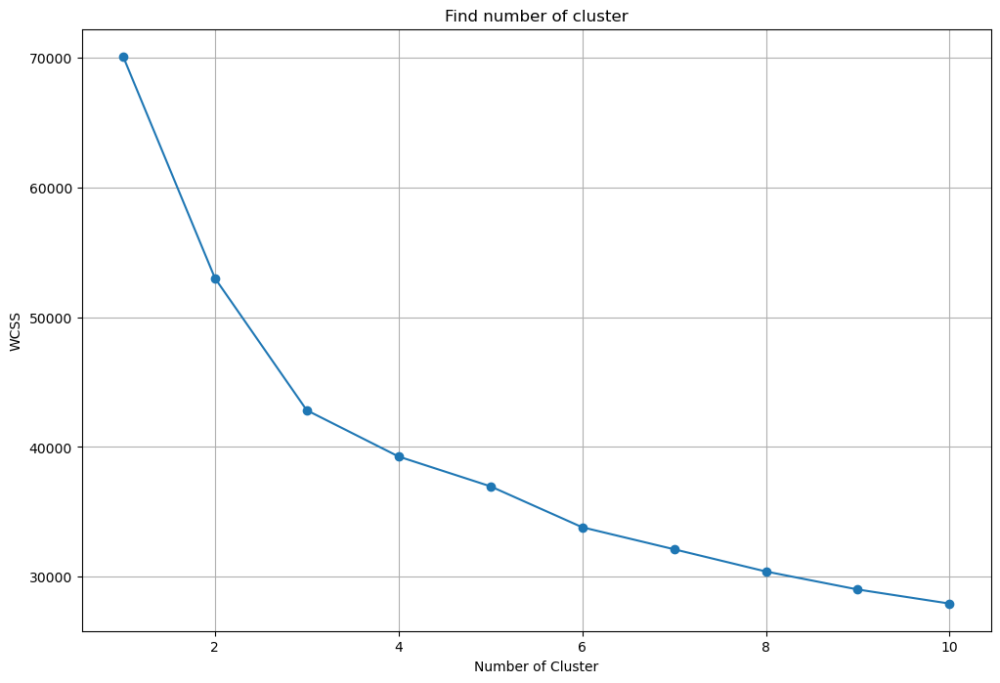

In [175]:
# plot the result

plt.figure(figsize=(12,8))
plt.plot(range(1,11),wcss_reduced,marker='o', linestyle = '-')
plt.title('Find number of cluster')
plt.xlabel('Number of Cluster')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [176]:
n_clusters = 3

# fit the KMeans model

kmeans = KMeans(n_clusters=n_clusters,random_state=42)
kmeans.fit(scaled_data)

# predict the cluster assignments for each row

cluster_assignments = kmeans.predict(scaled_data)

In [177]:
df =df.iloc[:,:-18]

In [178]:
df['furnishing_type'] = cluster_assignments

In [179]:
df.head()[['furnishDetails','furnishing_type']]
#2 => unfurnished
#1 => semi-furnished
#0 => furnished

,furnishDetails,furnishing_type
0,"['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...",2
1,"['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...",0
2,NaN,2
3,NaN,2
4,[],2


## 5. Create luxury score column

In [180]:
from sklearn.preprocessing import MultiLabelBinarizer
import ast

In [181]:
# convert the string representation of lists in the 'features' column to actual lists

df['features_list'] = df['features'].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) and x.startswith('[') else [])

# Use multilabelBinarizer to convert the features list into a binary metrix
mlb = MultiLabelBinarizer()
features_binary_metrix = mlb.fit_transform(df['features_list'])

# convert the binary metrix into Dataframe
features_binary_df = pd.DataFrame(features_binary_metrix,columns=mlb.classes_)

In [182]:
features_binary_df.sample(5)

,Airy Rooms,Bank Attached Property,Centrally Air Conditioned,Club house / Community Center,False Ceiling Lighting,Feng Shui / Vaastu Compliant,Fitness Centre / GYM,High Ceiling Height,Intercom Facility,Internet/wi-fi connectivity,Lift(s),Low Density Society,Maintenance Staff,Natural Light,No open drainage around,Park,Piped-gas,Power Back-up,Private Garden / Terrace,Rain Water Harvesting,Recently Renovated,Security / Fire Alarm,Security Personnel,Separate entry for servant room,Shopping Centre,Spacious Interiors,Swimming Pool,Visitor Parking,Waste Disposal,Water Storage,Water purifier,Water softening plant
592,0,0,0,1,0,1,1,0,1,0,1,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1,1,0,1,0,0
1257,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2528,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3346,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3597,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,1,0,0,0,1,1,1,0,0


In [183]:
colss = features_binary_df.columns

In [184]:
for col in colss:
    print(col)

Airy Rooms
Bank Attached Property
Centrally Air Conditioned
Club house / Community Center
False Ceiling Lighting
Feng Shui / Vaastu Compliant
Fitness Centre / GYM
High Ceiling Height
Intercom Facility
Internet/wi-fi connectivity
Lift(s)
Low Density Society
Maintenance Staff
Natural Light
No open drainage around
Park
Piped-gas
Power Back-up
Private Garden / Terrace
Rain Water Harvesting
Recently Renovated
Security / Fire Alarm
Security Personnel
Separate entry for servant room
Shopping Centre
Spacious Interiors
Swimming Pool
Visitor Parking
Waste Disposal
Water Storage
Water purifier
Water softening plant


In [185]:
# Define the weights for each feature as provided
# Assigning weights based on perceived luxury contribution
weights = {
    'Airy Rooms': 8,
    'Bank Attached Property': 5,
    'Centrally Air Conditioned': 9,
    'Club house / Community Center': 7,
    'False Ceiling Lighting': 6,
    'Feng Shui / Vaastu Compliant': 7,
    'Fitness Centre / GYM': 8,
    'High Ceiling Height': 8,
    'Intercom Facility': 6,
    'Internet/wi-fi connectivity': 7,
    'Lift(s)': 9,
    'Low Density Society': 8,
    'Maintenance Staff': 6,
    'Natural Light': 8,
    'No open drainage around': 9,
    'Park': 9,
    'Piped-gas': 7,
    'Power Back-up': 9,
    'Private Garden / Terrace': 9,
    'Rain Water Harvesting': 7,
    'Recently Renovated': 6,
    'Security / Fire Alarm': 8,
    'Security Personnel': 9,
    'Separate entry for servant room': 6,
    'Shopping Centre': 7,
    'Spacious Interiors': 8,
    'Swimming Pool': 9,
    'Visitor Parking': 7,
    'Waste Disposal': 7,
    'Water Storage': 8,
    'Water purifier': 7,
    'Water softening plant': 7

}
# Calculate luxury score for each row
luxury_score = features_binary_df[list(weights.keys())].multiply(list(weights.values())).sum(axis=1)

In [186]:
df['luxury_score'] = luxury_score

In [187]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area,servant room,study room,others,pooja room,store room,furnishing_type,features_list,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,Plot area 290(242.48 sq.m.),2,2,1,not available,4.0,West,Relatively New,"['Chintapurni Mandir', 'State bank ATM', 'Pear...","['3 Fan', '4 Light', '1 Wardrobe', 'No AC', 'N...","['Feng Shui / Vaastu Compliant', 'Security / F...",NaN,2610.0,900.0,0,0,0,0,0,2,"[Feng Shui / Vaastu Compliant, Security / Fire...",39
1,house,apna enclave,sector 5,5.70,7692.0,539.0,Plot area 539(50.07 sq.m.),2,2,1,not available,1.0,West,Old Property,"['Chintapurni Mandir', 'Sheetla Mata Mandir', ...","['3 Wardrobe', '4 Fan', '1 Exhaust Fan', '1 Ge...","['Security / Fire Alarm', 'Maintenance Staff',...",NaN,539.0,650.0,0,0,0,0,0,0,"[Security / Fire Alarm, Maintenance Staff, Wat...",38
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,Plot area 61(51 sq.m.),2,2,3,not available,12.0,NA,New Property,"['Huda City Metro', 'Golf Course extn road', '...",NaN,"['Power Back-up', 'Feng Shui / Vaastu Complian...",NaN,549.0,595.0,0,0,0,0,0,2,"[Power Back-up, Feng Shui / Vaastu Compliant, ...",64
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,Plot area 129(107.86 sq.m.),2,2,2,study room,2.0,NA,Undefined,"['Sector 55-56 Metro station', 'Bestech Centra...",NaN,"['Security / Fire Alarm', 'Private Garden / Te...",NaN,1161.0,1200.0,0,1,0,0,0,2,"[Security / Fire Alarm, Private Garden / Terra...",100
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,Plot area 62(51.84 sq.m.),2,2,3,study room,5.0,NA,Under Construction,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. ...",[],NaN,1345.0,558.0,NaN,0,1,0,0,0,2,[],0


In [188]:
# Remove not important columns
# cols to drap -> nearbylocations, furnishDetails, features, features_list, assitionalRoom
df.drop(columns=['nearbyLocations','furnishDetails','features','features_list','additionalRoom'], inplace=True)

In [189]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,Plot area 290(242.48 sq.m.),2,2,1,4.0,West,Relatively New,NaN,2610.0,900.0,0,0,0,0,0,2,39
1,house,apna enclave,sector 5,5.70,7692.0,539.0,Plot area 539(50.07 sq.m.),2,2,1,1.0,West,Old Property,NaN,539.0,650.0,0,0,0,0,0,0,38
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,Plot area 61(51 sq.m.),2,2,3,12.0,NA,New Property,NaN,549.0,595.0,0,0,0,0,0,2,64
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,Plot area 129(107.86 sq.m.),2,2,2,2.0,NA,Undefined,NaN,1161.0,1200.0,0,1,0,0,0,2,100
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,Plot area 62(51.84 sq.m.),2,2,3,5.0,NA,Under Construction,1345.0,558.0,NaN,0,1,0,0,0,2,0


In [190]:
df.isnull().sum()

Property_type             0
society                   0
sector                    0
price                    18
Price_Per_sqFeets        19
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
floorNum                 21
facing                    0
agePossession             0
super_built_up_area    1969
built_up_area          1692
carpet_area            1917
servant room              0
study room                0
others                    0
pooja room                0
store room                0
furnishing_type           0
luxury_score              0
dtype: int64

In [191]:
df.shape

(3894, 23)

## Built up area

<Axes: xlabel='built_up_area', ylabel='super_built_up_area'>

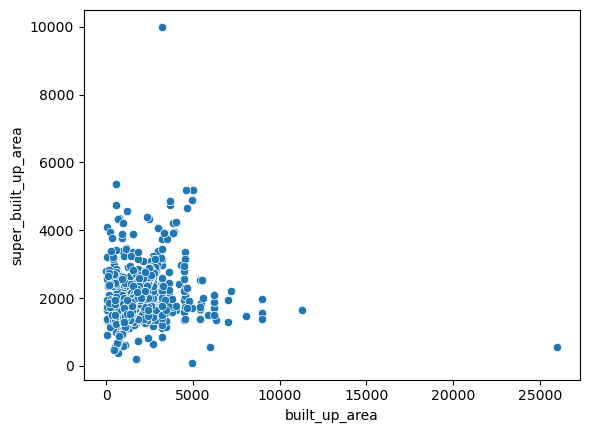

In [192]:
sns.scatterplot(x=df['built_up_area'],y=df['super_built_up_area'])

<Axes: xlabel='built_up_area', ylabel='carpet_area'>

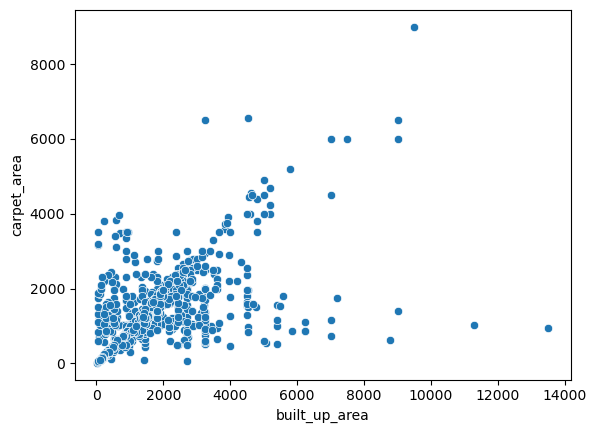

In [193]:
sns.scatterplot(x=df['built_up_area'],y=df['carpet_area'])

In [194]:
df.duplicated().sum()

15

In [195]:
df.drop_duplicates(inplace=True)

In [196]:
df.reset_index(drop=True, inplace=True)

In [197]:
all_present_df = df[~((df['super_built_up_area'].isnull()) | (df['built_up_area'].isnull()) | (df['carpet_area'].isnull()))]

In [198]:
all_present_df.shape

(628, 23)

In [199]:
super_to_built_up_ratio = (all_present_df['super_built_up_area']/all_present_df['built_up_area']).median()

In [200]:
carpet_to_built_up_ratio = (all_present_df['carpet_area']/all_present_df['built_up_area']).median()

In [201]:
print(super_to_built_up_ratio,carpet_to_built_up_ratio)

1.0947075736070166 0.8975551580202743


In [202]:
# both present built up null

sbc_df = df[~(df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & ~(df['carpet_area'].isnull())]

In [203]:
sbc_df['built_up_area'].fillna(round(((sbc_df['super_built_up_area']/1.105) + (sbc_df['carpet_area']/0.9))/2), inplace=True)

In [204]:
sbc_df

,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
59,flat,"gokuldham society, bahadurgarh",sector 7,0.50,5555.0,900.0,Super Built up area 900(83.61 sq.m.)Carpet are...,2,2,2,2.0,NA,Moderately Old,900.00,824.0,750.00,0,0,0,0,1,2,122
62,flat,umang winter hills,sector 77,0.99,7857.0,1260.0,Super Built up area 1260(117.06 sq.m.)Carpet a...,2,2,2,1.0,North,Relatively New,1260.00,1126.0,1000.00,0,0,0,0,0,2,146
72,flat,pareena laxmi apartments,sector 99,0.32,5521.0,580.0,Super Built up area 575(53.42 sq.m.)Carpet are...,2,2,1,2.0,NA,New Property,575.00,577.0,570.17,0,0,0,0,0,2,114
85,flat,puri the aravallis,sector 61,3.87,17200.0,2250.0,Super Built up area 2250(209.03 sq.m.)Carpet a...,3,4,3+,21.0,East,Undefined,2250.00,1712.0,1249.65,1,0,0,0,0,2,21
99,flat,godrej oasis,sector 88,1.29,7800.0,1654.0,Super Built up area 1629(151.34 sq.m.)Carpet a...,3,3,3,5.0,NA,New Property,1629.00,1642.0,1628.00,0,1,1,0,0,2,149
107,flat,ramsons kshitij,sector 95,0.32,4500.0,711.0,Super Built up area 700(65.03 sq.m.)Carpet are...,2,2,1,8.0,NA,Relatively New,700.00,563.0,443.32,0,0,1,0,0,1,0
109,flat,pareena laxmi apartments,sector 99,0.32,6106.0,524.0,Super Built up area 524(48.68 sq.m.)Carpet are...,2,2,2,2.0,NA,New Property,524.00,473.0,424.80,0,0,0,0,0,2,100
161,flat,ashiana anmol,sector 35,0.90,9463.0,951.0,Super Built up area 1275(118.45 sq.m.)Carpet a...,2,2,2,13.0,South,Relatively New,1275.00,1105.0,951.00,0,0,0,0,0,1,135
163,flat,umang winter hills,sector 77,1.35,7780.0,1735.0,Super Built up area 1735(161.19 sq.m.)Carpet a...,3,3,3+,7.0,NA,New Property,1735.00,1451.0,1199.00,0,0,0,0,1,0,0
203,flat,ramson kshitij sec-95 gurugram,sector 95,0.27,2700.0,1000.0,Super Built up area 1000(92.9 sq.m.)Carpet are...,2,2,0,1.0,West,Undefined,1000.00,758.0,550.00,0,0,0,0,0,2,90


In [205]:
df.update(sbc_df)

In [206]:
df.isnull().sum()

Property_type             0
society                   0
sector                    0
price                    18
Price_Per_sqFeets        19
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
floorNum                 21
facing                    0
agePossession             0
super_built_up_area    1959
built_up_area          1346
carpet_area            1909
servant room              0
study room                0
others                    0
pooja room                0
store room                0
furnishing_type           0
luxury_score              0
dtype: int64

In [207]:
# super built up area present, Carpet_area is null, bult_up_area is null
sb_df = df[~(df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & (df['carpet_area'].isnull())]

In [208]:
sb_df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
61,flat,sare crescent parc royal greens phase 1,sector 92,0.95,5007.0,1897.0,Super Built up area 1897(176.24 sq.m.),4.0,5.0,3+,4.0,NA,Moderately Old,1897.0,NaN,NaN,1.0,0.0,0.0,0.0,0.0,2.0,117.0
63,flat,ramprastha skyz,sector 37,1.10,6376.0,1725.0,Super Built up area 1725(160.26 sq.m.),3.0,3.0,3+,7.0,East,Undefined,1725.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,2.0,62.0
64,flat,4s aradhya homes,sector 67,1.90,8863.0,2144.0,Super Built up area 2200(204.39 sq.m.),4.0,4.0,3,3.0,NA,New Property,2200.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,64.0
65,flat,ild greens,sector 37,1.00,4320.0,2315.0,Super Built up area 1875(174.19 sq.m.),3.0,3.0,3+,5.0,North,Under Construction,1875.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,2.0,0.0
66,flat,bptp freedom park life,sector 57,2.50,11111.0,2250.0,Super Built up area 2250(209.03 sq.m.),3.0,3.0,3,9.0,NA,Moderately Old,2250.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,2.0,0.0


In [209]:
sb_df['built_up_area'].fillna(round(sb_df['super_built_up_area']/1.105), inplace=True)

In [210]:
df.update(sb_df)

In [211]:
df.isnull().sum()

Property_type             0
society                   0
sector                    0
price                    18
Price_Per_sqFeets        19
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
floorNum                 21
facing                    0
agePossession             0
super_built_up_area    1959
built_up_area           639
carpet_area            1909
servant room              0
study room                0
others                    0
pooja room                0
store room                0
furnishing_type           0
luxury_score              0
dtype: int64

In [212]:
ca_df = df[(df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & ~(df['carpet_area'].isnull())]

In [213]:
ca_df.shape

(639, 23)

In [214]:
ca_df['built_up_area'].fillna(round(ca_df['carpet_area']/0.9), inplace=True)

In [215]:
df.update(ca_df)

In [216]:
df.isnull().sum()

Property_type             0
society                   0
sector                    0
price                    18
Price_Per_sqFeets        19
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
floorNum                 21
facing                    0
agePossession             0
super_built_up_area    1959
built_up_area             0
carpet_area            1909
servant room              0
study room                0
others                    0
pooja room                0
store room                0
furnishing_type           0
luxury_score              0
dtype: int64

<Axes: xlabel='built_up_area', ylabel='price'>

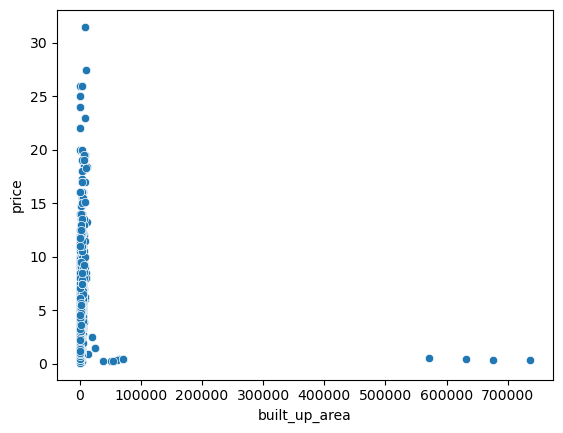

In [217]:
sns.scatterplot(x=df['built_up_area'],y=df['price'])

In [218]:
anamoly_df = df[(df['built_up_area'] < 2000) & (df['price'] > 2.5)][['price','area','built_up_area']]

In [219]:
anamoly_df.shape

(440, 3)

In [220]:
anamoly_df['built_up_area'] = anamoly_df['area']

In [221]:
anamoly_df

,price,area,built_up_area
1,5.70,539.0,539.0
3,5.00,1161.0,1161.0
4,3.00,558.0,558.0
5,4.50,1152.0,1152.0
7,20.00,4091.0,4091.0
10,4.45,1350.0,1350.0
12,5.00,1467.0,1467.0
18,7.35,1760.0,1760.0
24,7.60,1961.0,1961.0
32,10.00,818.0,818.0


In [222]:
df.update(anamoly_df)

<Axes: xlabel='built_up_area', ylabel='price'>

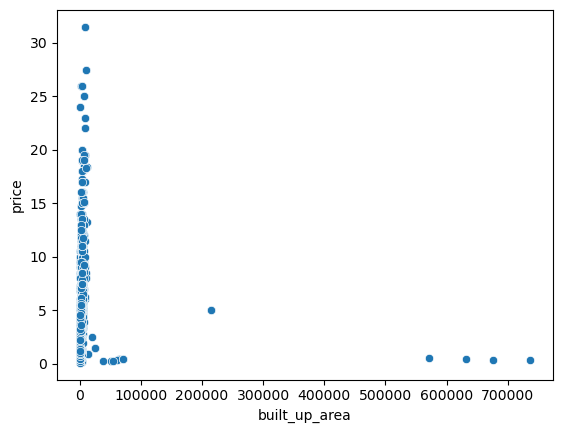

In [223]:
sns.scatterplot(x = df['built_up_area'], y= df['price'])

In [224]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,Plot area 290(242.48 sq.m.),2.0,2.0,1,4.0,West,Relatively New,NaN,2610.0,900.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,7692.0,539.0,Plot area 539(50.07 sq.m.),2.0,2.0,1,1.0,West,Old Property,NaN,539.0,650.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,Plot area 61(51 sq.m.),2.0,2.0,3,12.0,NA,New Property,NaN,549.0,595.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,Plot area 129(107.86 sq.m.),2.0,2.0,2,2.0,NA,Undefined,NaN,1161.0,1200.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,Plot area 62(51.84 sq.m.),2.0,2.0,3,5.0,NA,Under Construction,1345.0,558.0,NaN,0.0,1.0,0.0,0.0,0.0,2.0,0.0


In [225]:
df.drop(columns=['areaWithType','super_built_up_area','carpet_area'], inplace=True)

In [226]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,2.0,2.0,1,4.0,West,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,7692.0,539.0,2.0,2.0,1,1.0,West,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,2.0,2.0,3,12.0,NA,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,2.0,2.0,2,2.0,NA,Undefined,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,2.0,2.0,3,5.0,NA,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0


In [227]:
df.isnull().sum()

Property_type         0
society               0
sector                0
price                18
Price_Per_sqFeets    19
area                 18
bedRoom               0
bathroom              0
balcony               0
floorNum             21
facing                0
agePossession         0
built_up_area         0
servant room          0
study room            0
others                0
pooja room            0
store room            0
furnishing_type       0
luxury_score          0
dtype: int64

In [228]:
df[df['floorNum'].isnull()]

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
179,flat,experion heartsong,sector 104,1.08,6150.0,1756.0,3.0,3.0,0,NaN,NA,Under Construction,1758.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0
2726,flat,nan,sector 78,0.60,3692.0,1625.0,2.0,2.0,0,NaN,NA,Under Construction,1625.0,0.0,0.0,0.0,0.0,0.0,2.0,121.0
2982,house,vipul tatvam villa,sector 48,8.50,26235.0,3240.0,4.0,4.0,2,NaN,East,Moderately Old,3240.0,0.0,0.0,0.0,0.0,0.0,2.0,123.0
3009,house,independent,sector 23,5.60,17284.0,3240.0,8.0,6.0,3+,NaN,South-West,Moderately Old,3240.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0
3086,house,independent,sector 24,1.45,26852.0,540.0,3.0,3.0,1,NaN,NA,Old Property,540.0,0.0,0.0,0.0,0.0,0.0,2.0,57.0
3128,house,independent,sector 5,1.50,10288.0,1458.0,3.0,3.0,0,NaN,NA,Old Property,210.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0
3146,house,independent,sector 43,4.12,8889.0,4635.0,2.0,1.0,3+,NaN,NA,Moderately Old,4635.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0
3156,house,independent,sector 23,2.50,5472.0,4569.0,3.0,2.0,1,NaN,NA,Old Property,4000.0,0.0,0.0,0.0,0.0,0.0,2.0,68.0
3210,house,independent,sector 43,0.65,11111.0,585.0,4.0,2.0,2,NaN,NA,Moderately Old,585.0,0.0,0.0,0.0,0.0,0.0,2.0,133.0
3230,house,ansal sushant lok plots,sector 43,3.30,26570.0,1242.0,1.0,1.0,0,NaN,NA,Under Construction,1242.0,0.0,0.0,0.0,0.0,0.0,2.0,182.0


In [229]:
df[df['Property_type'] == 'house']['floorNum'].median()

3.0

In [230]:
df['floorNum'].fillna(2.0, inplace=True)

In [231]:
df.isnull().sum()

Property_type         0
society               0
sector                0
price                18
Price_Per_sqFeets    19
area                 18
bedRoom               0
bathroom              0
balcony               0
floorNum              0
facing                0
agePossession         0
built_up_area         0
servant room          0
study room            0
others                0
pooja room            0
store room            0
furnishing_type       0
luxury_score          0
dtype: int64

<Axes: ylabel='facing'>

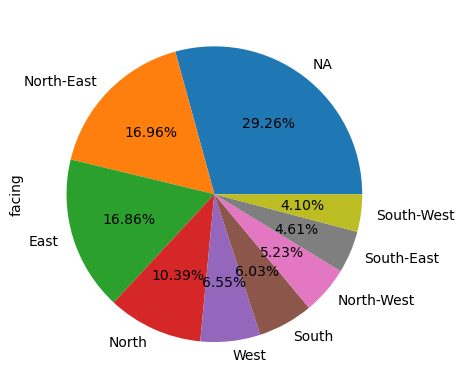

In [232]:
df['facing'].value_counts().plot(kind='pie',autopct='%0.2f%%')

In [233]:
df.drop(columns=['facing'], inplace=True)

In [234]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,7692.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,2.0,2.0,2,2.0,Undefined,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0


In [235]:
df.isnull().sum()

Property_type         0
society               0
sector                0
price                18
Price_Per_sqFeets    19
area                 18
bedRoom               0
bathroom              0
balcony               0
floorNum              0
agePossession         0
built_up_area         0
servant room          0
study room            0
others                0
pooja room            0
store room            0
furnishing_type       0
luxury_score          0
dtype: int64

In [236]:
df[df['agePossession'] == 'Undefined']

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,2.0,2.0,2,2.0,Undefined,1161.00,0.0,1.0,0.0,0.0,0.0,2.0,100.0
5,house,signature global infinity mall,sector 36,4.50,6269.0,1152.0,2.0,2.0,3,3.0,Undefined,1152.00,0.0,0.0,0.0,0.0,0.0,2.0,0.0
9,house,raheja revanta,sector 78,1.95,16885.0,1935.0,3.0,3.0,2,31.0,Undefined,1935.00,1.0,0.0,0.0,0.0,0.0,2.0,113.0
10,house,signature global city 81,sector 81,4.45,9767.0,1350.0,2.0,2.0,2,1.0,Undefined,1350.00,0.0,0.0,0.0,0.0,0.0,2.0,60.0
15,house,sobha city,sector 108,2.00,16859.0,1341.0,4.0,5.0,3,25.0,Undefined,1341.00,0.0,0.0,0.0,0.0,0.0,2.0,0.0
16,house,senate court,sector 62,10.75,14084.0,3600.0,1.0,1.0,0,1.0,Undefined,3600.00,0.0,0.0,0.0,0.0,0.0,2.0,0.0
17,house,shapoorji pallonji joyville gurugram,sector 102,2.10,11475.0,900.0,2.0,2.0,2,1.0,Undefined,900.00,0.0,0.0,0.0,0.0,0.0,2.0,60.0
20,house,smart world gems,sector 89,3.40,9156.0,2628.0,2.0,2.0,2,4.0,Undefined,2628.00,0.0,1.0,0.0,0.0,0.0,2.0,62.0
25,house,the serenas,sector 36,4.75,7910.0,5067.0,2.0,2.0,1,3.0,Undefined,5067.00,0.0,0.0,0.0,0.0,0.0,2.0,0.0
26,house,m3m golfestate,sector 65,3.50,18331.0,2610.0,3.0,4.0,2,20.0,Undefined,2610.00,0.0,0.0,0.0,0.0,0.0,2.0,60.0


In [237]:
def mode_based_imputation(row):
    if row['agePossession'] == 'Undefined':
        mode_value = df[(df['sector'] == row['sector']) & (df['Property_type'] == row['Property_type'])]['agePossession'].mode()
        if not mode_value.empty:
            return mode_value.iloc[0]
        else:
            return np.nan
    else:
        return row['agePossession']

In [238]:
df['agePossession'] = df.apply(mode_based_imputation,axis=1)

In [239]:
df['agePossession'].value_counts()

Relatively New        1931
New Property           700
Moderately Old         659
Old Property           378
Under Construction     134
Undefined               77
Name: agePossession, dtype: int64

In [240]:
def mode_based_imputation2(row):
    if row['agePossession'] == 'Undefined':
        mode_value = df[(df['sector'] == row['sector'])]['agePossession'].mode()
        if not mode_value.empty:
            return mode_value.iloc[0]
        else:
            return np.nan
    else:
        return row['agePossession']

In [241]:
df['agePossession'] = df.apply(mode_based_imputation2, axis=1)

In [242]:
df['agePossession'].value_counts()

Relatively New        1934
New Property           717
Moderately Old         660
Old Property           386
Under Construction     134
Undefined               48
Name: agePossession, dtype: int64

In [243]:
def mode_based_imputation3(row):
    if row['agePossession'] == 'Undefined':
        mode_value = df[(df['Property_type'] == row['Property_type'])]['agePossession'].mode()
        if not mode_value.empty:
            return mode_value.iloc[0]
        else:
            return np.nan
    else:
        return row['agePossession']

In [244]:
df['agePossession'] = df.apply(mode_based_imputation3,axis=1)

In [245]:
df['agePossession'].value_counts()

Relatively New        1982
New Property           717
Moderately Old         660
Old Property           386
Under Construction     134
Name: agePossession, dtype: int64

In [246]:
df.isnull().sum()

Property_type         0
society               0
sector                0
price                18
Price_Per_sqFeets    19
area                 18
bedRoom               0
bathroom              0
balcony               0
floorNum              0
agePossession         0
built_up_area         0
servant room          0
study room            0
others                0
pooja room            0
store room            0
furnishing_type       0
luxury_score          0
dtype: int64

In [247]:
df = df[~df['price'].isnull()]

In [248]:
df.isnull().sum()

Property_type        0
society              0
sector               0
price                0
Price_Per_sqFeets    1
area                 0
bedRoom              0
bathroom             0
balcony              0
floorNum             0
agePossession        0
built_up_area        0
servant room         0
study room           0
others               0
pooja room           0
store room           0
furnishing_type      0
luxury_score         0
dtype: int64

In [249]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,7692.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,2.0,2.0,2,2.0,New Property,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0


In [250]:
df.shape

(3861, 19)

In [251]:
df.columns

Index(['Property_type', 'society', 'sector', 'price', 'Price_Per_sqFeets',
       'area', 'bedRoom', 'bathroom', 'balcony', 'floorNum', 'agePossession',
       'built_up_area', 'servant room', 'study room', 'others', 'pooja room',
       'store room', 'furnishing_type', 'luxury_score'],
      dtype='object')

<Axes: xlabel='price', ylabel='Density'>

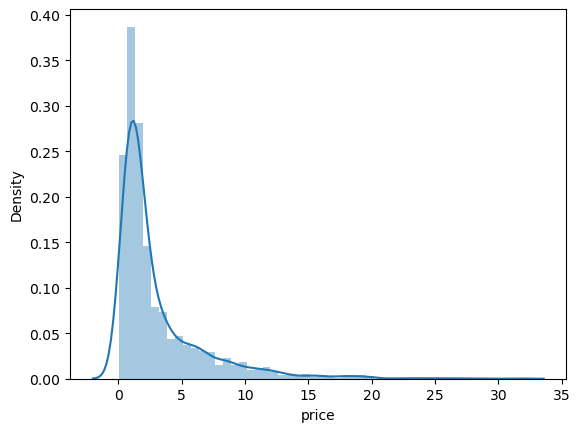

In [252]:
sns.distplot(df['price'])

<Axes: xlabel='price'>

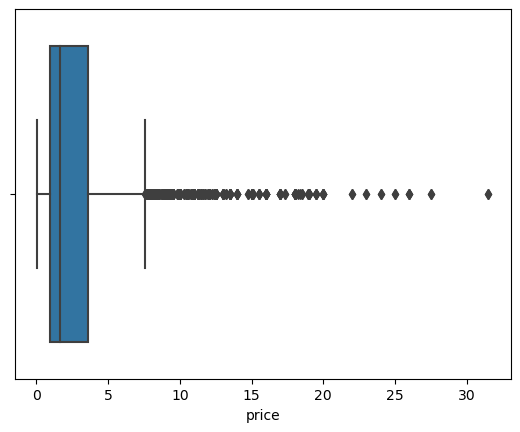

In [253]:
sns.boxplot(x=df['price'])

In [254]:
# Calculate the IQR for the 'price' column

Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3-Q1

# defind boundries
lower_bound = Q1 - 1.5*IQR
upper_bound = Q3 + 1.5*IQR

# Identify Outliers
outliers = df[(df['price'] < lower_bound) |(df['price'] > upper_bound)]

# Display the number of outliers and some statistics
num_outliers = outliers.shape[0]
outliers_price_stats =outliers['price'].describe()

num_outliers, outliers_price_stats

(381,
 count    381.000000
 mean      11.936745
 std        4.252588
 min        7.600000
 25%        8.950000
 50%       10.550000
 75%       13.500000
 max       31.500000
 Name: price, dtype: float64)

In [255]:
outliers.sort_values('price',ascending=False).head(20)

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
937,house,dlf ridgewood estate,sector 27,31.5,14598.0,9000.0,3.0,3.0,1,12.0,Old Property,9000.0,0.0,0.0,0.0,0.0,0.0,0.0,181.0
3787,house,arjun marg/ sector- 26 phase- 1/ golf course road,sector 26,31.5,35000.0,9000.0,7.0,9.0,3+,3.0,Moderately Old,9000.0,0.0,0.0,0.0,0.0,0.0,1.0,181.0
3551,house,independent,sector 43,27.5,24366.0,11286.0,6.0,7.0,3+,3.0,Relatively New,11286.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0
685,house,emaar gurgaon greens,sector 102,27.5,9090.0,11286.0,3.0,3.0,3,7.0,Relatively New,11286.0,0.0,0.0,0.0,1.0,0.0,0.0,60.0
3584,house,dlf city plots,sector 26,26.0,57206.0,4545.0,6.0,7.0,3+,2.0,New Property,4545.0,0.0,0.0,0.0,0.0,0.0,0.0,111.0
718,house,m3m woodshire,sector 107,26.0,5856.0,4545.0,2.0,2.0,3+,7.0,Relatively New,4545.0,0.0,0.0,0.0,0.0,0.0,0.0,111.0
3542,house,independent,sector 26,26.0,82540.0,3150.0,16.0,16.0,3+,4.0,New Property,3150.0,0.0,0.0,0.0,0.0,0.0,1.0,217.0
876,house,kiran residency,sector 56,25.0,7750.0,8036.0,3.0,3.0,3,5.0,Old Property,8036.0,1.0,0.0,0.0,0.0,0.0,0.0,219.0
3726,house,suncity township,sector 54,25.0,31111.0,8036.0,4.0,4.0,3+,2.0,Moderately Old,8036.0,0.0,0.0,0.0,0.0,0.0,2.0,219.0
3507,house,emaar the palm springs,sector 54,24.0,600000.0,400.0,5.0,5.0,2,1.0,Old Property,400.0,0.0,0.0,0.0,0.0,0.0,0.0,60.0


In [256]:
# on the basis of price column is a genuanin data point

### Price_per_sqFeets

<Axes: xlabel='Price_Per_sqFeets', ylabel='Density'>

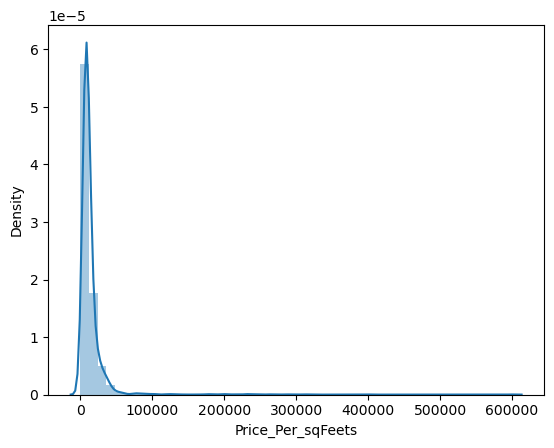

In [257]:
sns.distplot(df['Price_Per_sqFeets'])

<Axes: xlabel='Price_Per_sqFeets'>

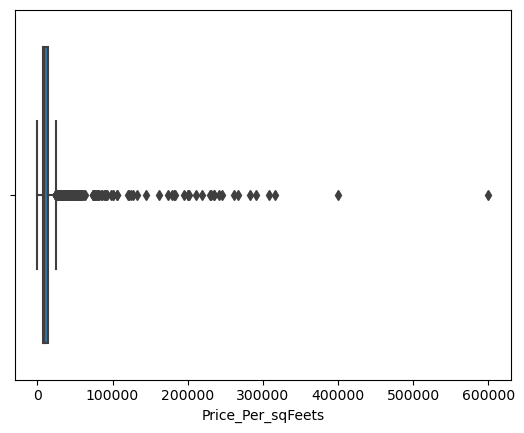

In [258]:
sns.boxplot(x=df['Price_Per_sqFeets'])

In [259]:
# find Outliers using IQR method
Q1 = df['Price_Per_sqFeets'].quantile(0.25)
Q3 = df['Price_Per_sqFeets'].quantile(0.75)
IQR = Q3 - Q1

# Find boudries
lower_bound_pf = Q1 - 1.5*IQR
upper_bound_pf = Q3 + 1.5*IQR

outliers_price_sqfeets = df[(df['Price_Per_sqFeets'] < lower_bound_pf) | (df['Price_Per_sqFeets'] > upper_bound_pf)]

# Display the outliers and some statistics and description
num_outliers_pf = outliers_price_sqfeets.shape[0]
outliers_price_stats_pf = outliers_price_sqfeets['Price_Per_sqFeets'].describe()

num_outliers_pf, outliers_price_stats_pf

(375,
 count       375.000000
 mean      52868.480000
 std       60481.817407
 min       24280.000000
 25%       27891.000000
 50%       33333.000000
 75%       42208.000000
 max      600000.000000
 Name: Price_Per_sqFeets, dtype: float64)

In [260]:
outliers_price_sqfeets['area'] = outliers_price_sqfeets['area'].apply(lambda x:x*9 if x<1000 else x)

In [261]:
outliers_price_sqfeets['Price_Per_sqFeets'] = round((outliers_price_sqfeets['price']*10000000)/outliers_price_sqfeets['area'])

In [262]:
outliers_price_sqfeets.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
27,house,central park resort belgravia residences,sector 48,5.00,21124.0,2367.0,3.0,5.0,3+,5.0,Moderately Old,2367.0,1.0,0.0,0.0,0.0,0.0,0.0,54.0
30,house,ompee k s residency,sector 23,10.00,37037.0,2700.0,2.0,2.0,2,1.0,Relatively New,2700.0,0.0,0.0,0.0,0.0,0.0,2.0,167.0
247,house,tulip monsella,sector 53,8.25,28004.0,2946.0,3.0,4.0,3,8.0,Moderately Old,2700.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
252,flat,emaar digihomes,sector 62,4.25,26562.0,1600.0,3.0,3.0,3,8.0,Under Construction,1600.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0
279,flat,dlf the grove,sector 54,5.70,41245.0,1382.0,3.0,3.0,3,1.0,Moderately Old,1382.0,0.0,0.0,0.0,0.0,0.0,2.0,232.0


In [263]:
outliers_price_sqfeets['Price_Per_sqFeets'].describe()

count      375.00000
mean     28808.85600
std      12507.65744
min        617.00000
25%      24885.50000
50%      29545.00000
75%      35489.00000
max      82540.00000
Name: Price_Per_sqFeets, dtype: float64

In [264]:
df.update(outliers_price_sqfeets)

<Axes: xlabel='Price_Per_sqFeets', ylabel='Density'>

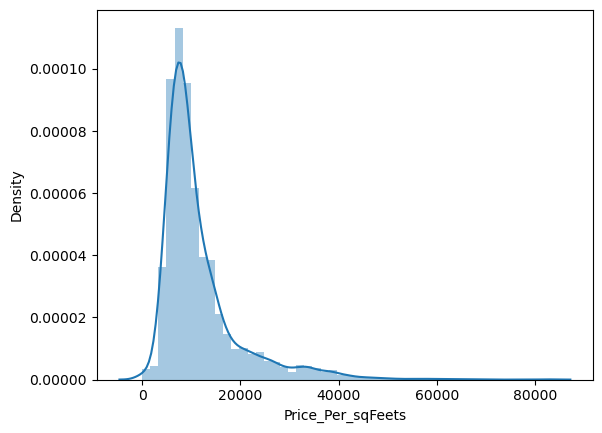

In [265]:
sns.distplot(df['Price_Per_sqFeets'])

<Axes: xlabel='Price_Per_sqFeets'>

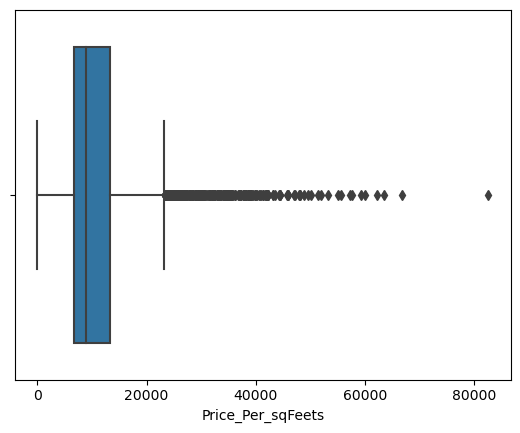

In [266]:
sns.boxplot(x=df['Price_Per_sqFeets'])

In [267]:
df = df[df['Price_Per_sqFeets'] < 50000]

<Axes: xlabel='Price_Per_sqFeets'>

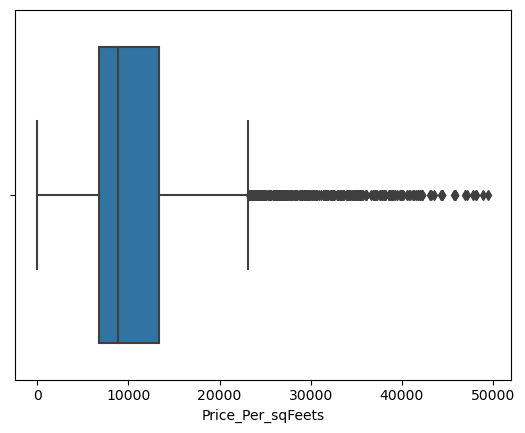

In [268]:
sns.boxplot(x=df['Price_Per_sqFeets'])

### Area

<Axes: xlabel='area', ylabel='Density'>

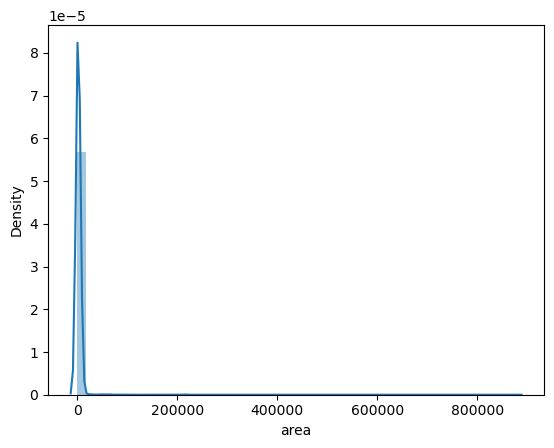

In [269]:
sns.distplot(df['area'])

<Axes: xlabel='area'>

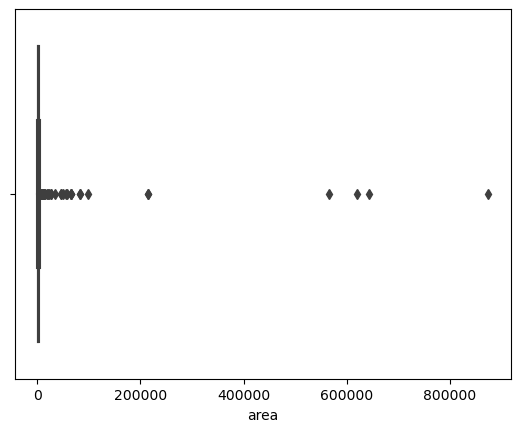

In [270]:
sns.boxplot(x=df['area'])

In [271]:
df['area'].describe()

count      3846.000000
mean       3038.975559
std       22907.864408
min          45.000000
25%        1202.750000
50%        1757.000000
75%        2430.000000
max      875000.000000
Name: area, dtype: float64

In [272]:
df[df['area'] > 100000].shape

(6, 19)

In [273]:
df = df[df['area']<100000]

<Axes: xlabel='area', ylabel='Density'>

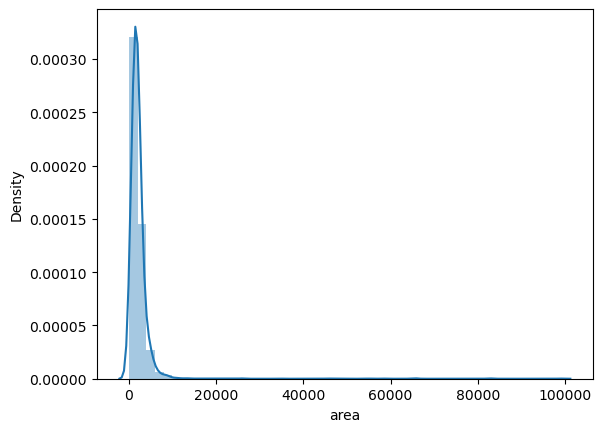

In [274]:
sns.distplot(df['area'])

<Axes: xlabel='area'>

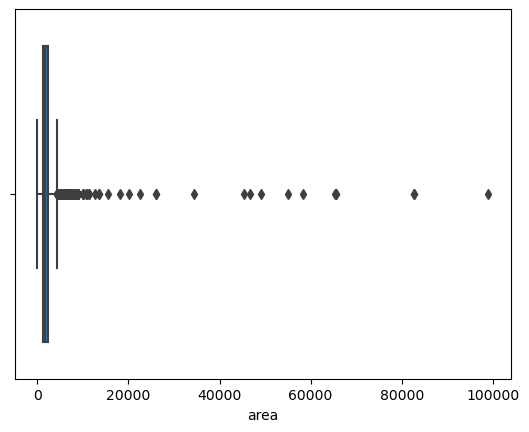

In [275]:
sns.boxplot(x=df['area'])

In [276]:
df[df['area'] > 10000]
# 81, 1298, 1301, 1302, 1303, 1424, 1631, 2320, 

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
81,flat,pyramid elite,sector 86,0.46,79.0,58228.0,2.0,2.0,1,1.0,Under Construction,64601.0,0.0,0.0,0.0,0.0,0.0,2.0,137.0
144,house,smart world gems,sector 89,0.85,12526.0,13492.0,3.0,3.0,3,3.0,New Property,13500.0,0.0,0.0,0.0,1.0,1.0,2.0,53.0
222,house,zara aavaas,sector 104,1.45,7036.0,26032.0,2.0,2.0,1,4.0,Relatively New,26000.0,0.0,0.0,0.0,0.0,0.0,2.0,55.0
382,house,friends apartment,sector 52,1.25,8510.0,82781.0,4.0,3.0,3,5.0,Moderately Old,115.0,1.0,0.0,0.0,0.0,0.0,1.0,123.0
685,house,emaar gurgaon greens,sector 102,27.50,9090.0,11286.0,3.0,3.0,3,7.0,Relatively New,11286.0,0.0,0.0,0.0,1.0,0.0,0.0,60.0
1298,flat,ramsons kshitij,sector 95,0.24,53.0,45283.0,2.0,2.0,1,10.0,Relatively New,51073.0,0.0,0.0,1.0,0.0,0.0,2.0,60.0
1301,flat,rof ananda,sector 95,0.33,60.0,55000.0,2.0,2.0,1,13.0,Relatively New,61019.0,0.0,0.0,0.0,0.0,0.0,2.0,204.0
1302,flat,rof ananda,sector 95,0.38,58.0,65517.0,3.0,2.0,1,12.0,Relatively New,71569.0,0.0,0.0,0.0,0.0,0.0,2.0,125.0
1303,flat,rof ananda,sector 95,0.21,61.0,34426.0,1.0,1.0,1,13.0,Relatively New,38223.0,0.0,0.0,0.0,0.0,0.0,2.0,130.0
1424,flat,signature the serenas,sector 35,0.28,57.0,49123.0,1.0,1.0,2,1.0,Relatively New,54234.0,0.0,1.0,0.0,0.0,0.0,2.0,213.0


In [277]:
df[df['area'] > 10000].sort_values('area',ascending=False)

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
3626,house,independent,sector 26,18.40,1859.0,98978.0,6.0,8.0,3+,4.0,Relatively New,12222.0,0.0,0.0,0.0,0.0,0.0,0.0,227.0
382,house,friends apartment,sector 52,1.25,8510.0,82781.0,4.0,3.0,3,5.0,Moderately Old,115.0,1.0,0.0,0.0,0.0,0.0,1.0,123.0
3268,house,ganpati heights apartment,sector 13,1.25,151.0,82781.0,10.0,6.0,2,3.0,Old Property,115.0,0.0,0.0,0.0,0.0,0.0,2.0,123.0
1302,flat,rof ananda,sector 95,0.38,58.0,65517.0,3.0,2.0,1,12.0,Relatively New,71569.0,0.0,0.0,0.0,0.0,0.0,2.0,125.0
2319,flat,rof ananda,sector 95,0.38,58.0,65517.0,2.0,2.0,2,10.0,New Property,71699.0,0.0,1.0,0.0,0.0,0.0,2.0,77.0
3344,house,dlf city plot phase 4,sector 27,13.00,1992.0,65261.0,10.0,10.0,3+,1.0,Relatively New,8056.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0
81,flat,pyramid elite,sector 86,0.46,79.0,58228.0,2.0,2.0,1,1.0,Under Construction,64601.0,0.0,0.0,0.0,0.0,0.0,2.0,137.0
1301,flat,rof ananda,sector 95,0.33,60.0,55000.0,2.0,2.0,1,13.0,Relatively New,61019.0,0.0,0.0,0.0,0.0,0.0,2.0,204.0
1424,flat,signature the serenas,sector 35,0.28,57.0,49123.0,1.0,1.0,2,1.0,Relatively New,54234.0,0.0,1.0,0.0,0.0,0.0,2.0,213.0
3537,house,independent,sector 25,7.30,1560.0,46795.0,9.0,9.0,2,3.0,Relatively New,5800.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0


In [278]:
df.loc[3283, 'area'] = 115*9
df.loc[3359, 'area'] = 7250
df.loc[3552, 'area'] = 5800
df.loc[3085, 'area'] = 2660
df.loc[3092, 'area'] = 2160
df.loc[2832, 'area'] = 1175
df.loc[3500, 'area'] = 3500

In [279]:
df.loc[3614, 'area'] = 2850

<Axes: xlabel='area', ylabel='Density'>

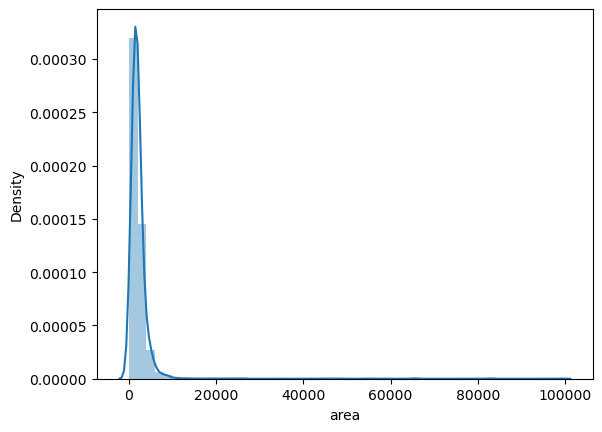

In [280]:
sns.distplot(df['area'])

<Axes: xlabel='area'>

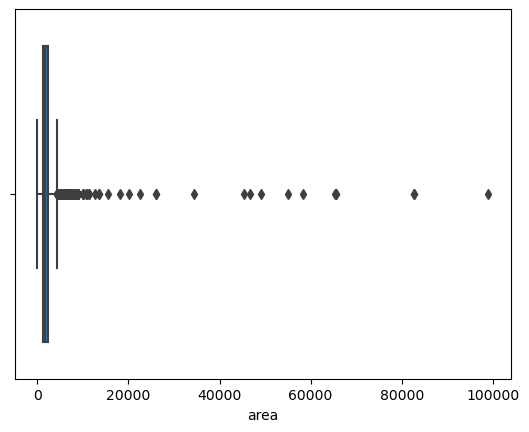

In [281]:
sns.boxplot(x=df['area'])

In [282]:
df['area'].describe()

count     3840.000000
mean      2230.034635
std       3851.273193
min         45.000000
25%       1204.250000
50%       1757.000000
75%       2430.000000
max      98978.000000
Name: area, dtype: float64

### bedRoom

<Axes: xlabel='bedRoom', ylabel='Density'>

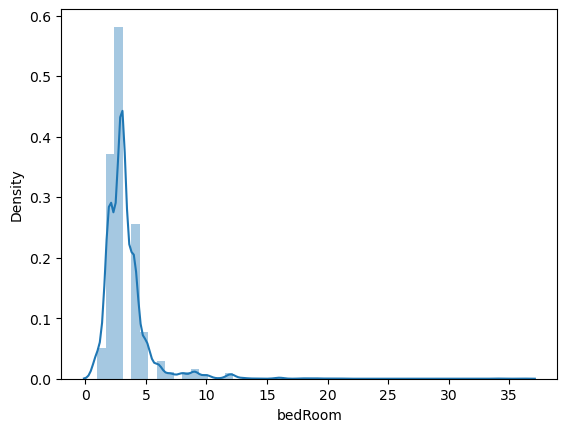

In [283]:
sns.distplot(df['bedRoom'])

<Axes: xlabel='bedRoom'>

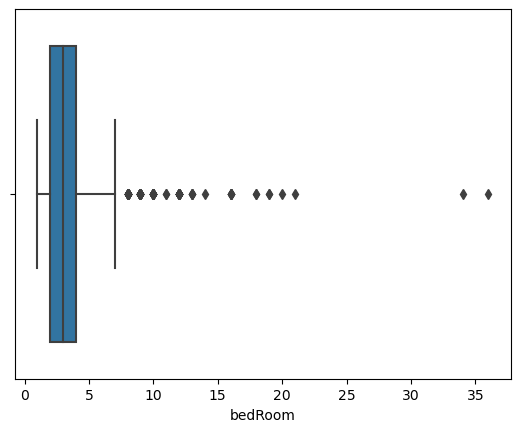

In [284]:
sns.boxplot(x=df['bedRoom'])

In [285]:
df['bedRoom'].describe()

count    3840.000000
mean        3.329687
std         1.940682
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        36.000000
Name: bedRoom, dtype: float64

In [286]:
df[df['bedRoom'] > 10].shape

(47, 19)

In [287]:
df = df[df['bedRoom'] <= 10]

In [288]:
df.shape

(3793, 19)

In [289]:
df['bedRoom'].describe()

count    3793.000000
mean        3.191405
std         1.391566
min         1.000000
25%         2.000000
50%         3.000000
75%         4.000000
max        10.000000
Name: bedRoom, dtype: float64

<Axes: xlabel='bedRoom', ylabel='Density'>

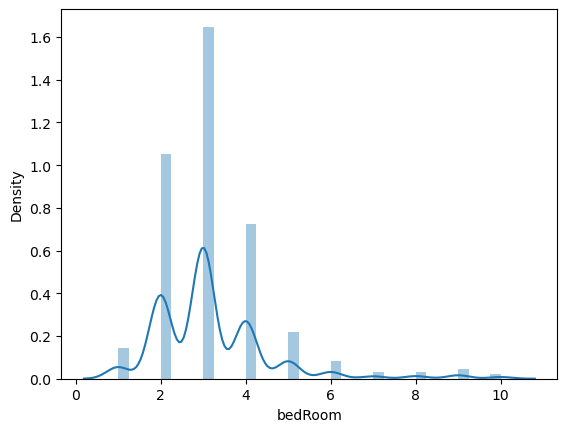

In [290]:
sns.distplot(df['bedRoom'])

<Axes: xlabel='bedRoom'>

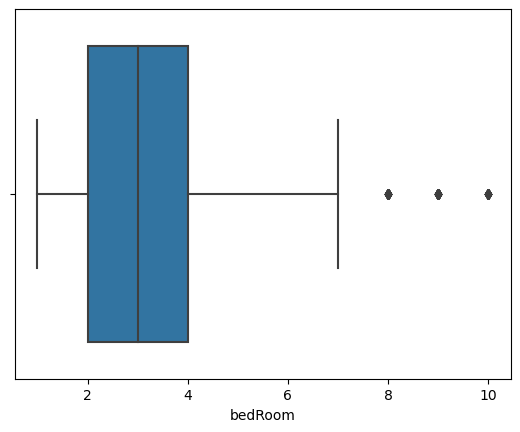

In [291]:
sns.boxplot(x=df['bedRoom'])

<Axes: xlabel='bathroom', ylabel='Density'>

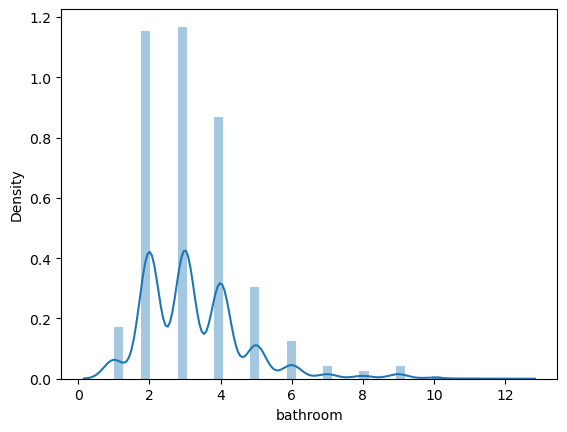

In [292]:
sns.distplot(df['bathroom'])

<Axes: xlabel='bathroom'>

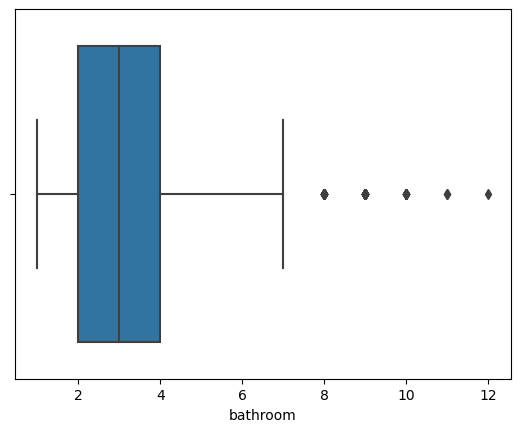

In [293]:
sns.boxplot(x=df['bathroom'])

In [294]:
df[df['bathroom'] > 10].sort_values('bathroom', ascending=False)

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
3438,house,adani brahma samsara,sector 60,18.02,28200.0,6390.0,9.0,12.0,3+,3.0,Relatively New,6390.0,0.0,0.0,0.0,0.0,0.0,0.0,232.0
3378,house,independent,sector 39,7.00,10000.0,7000.0,10.0,11.0,3+,4.0,Relatively New,7000.0,0.0,0.0,0.0,0.0,0.0,1.0,60.0
3437,house,independent,sector 24,11.00,28902.0,3806.0,8.0,11.0,3+,3.0,Old Property,5000.0,0.0,0.0,0.0,0.0,0.0,0.0,226.0


In [295]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,7692.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,2.0,2.0,2,2.0,New Property,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0


### built up area

<Axes: xlabel='built_up_area', ylabel='Density'>

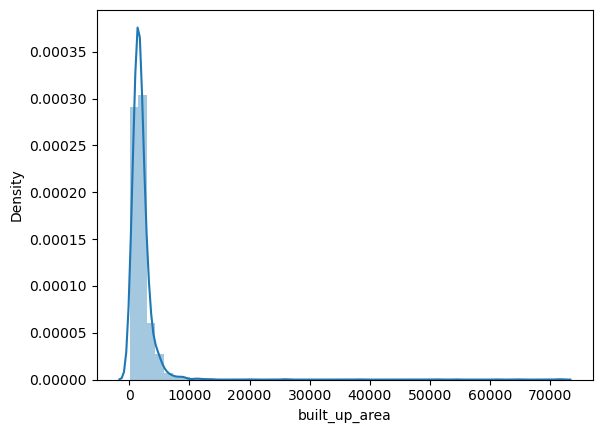

In [296]:
sns.distplot(df['built_up_area'])

<Axes: xlabel='built_up_area'>

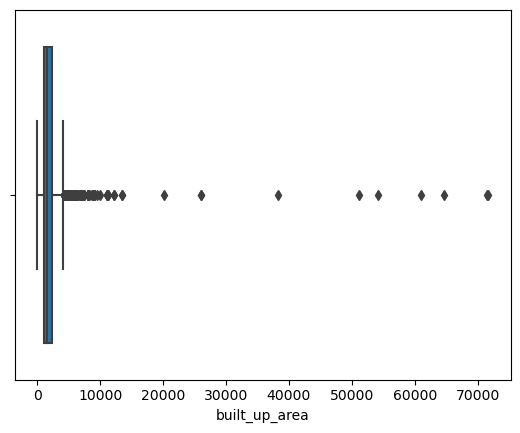

In [297]:
sns.boxplot(x=df['built_up_area'])

In [298]:
df = df[(df['built_up_area'] != 13500) | (df['built_up_area'] != 26000)]

In [299]:
df.shape

(3793, 19)

<Axes: xlabel='luxury_score', ylabel='Density'>

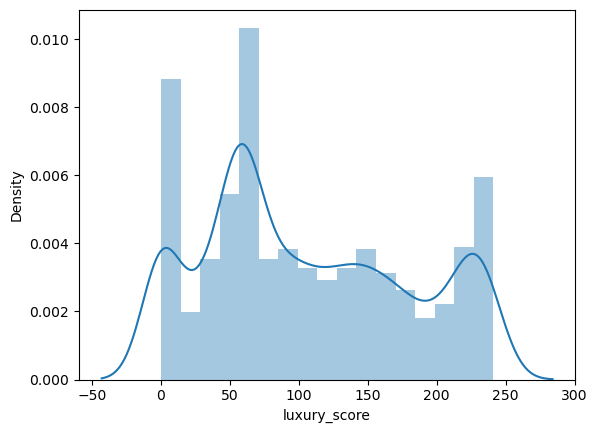

In [300]:
sns.distplot(df['luxury_score'])

<Axes: xlabel='luxury_score'>

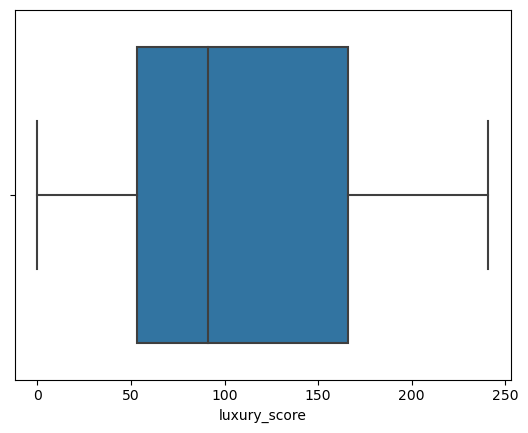

In [301]:
sns.boxplot(x=df['luxury_score'])

In [302]:
df.shape

(3793, 19)

In [303]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,5000.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,7692.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,6722.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,12250.0,1161.0,2.0,2.0,2,2.0,New Property,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,5204.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0


In [304]:
df['Price_Per_sqFeets']= round((df['price']*10000000)/df['area'])

In [305]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
0,house,maa bhagwati residency,sector 7,5.25,20115.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0
1,house,apna enclave,sector 5,5.70,105751.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0
2,house,tulsiani easy in homes,sector 35,2.10,38251.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0
3,house,smart world orchard,sector 61,5.00,43066.0,1161.0,2.0,2.0,2,2.0,New Property,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0
4,house,parkwood westend,sector 92,3.00,53763.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0


<Axes: xlabel='Price_Per_sqFeets', ylabel='Density'>

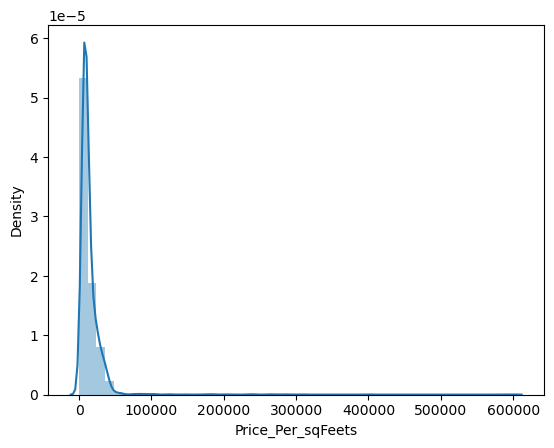

In [306]:
sns.distplot(df['Price_Per_sqFeets'])

<Axes: xlabel='Price_Per_sqFeets'>

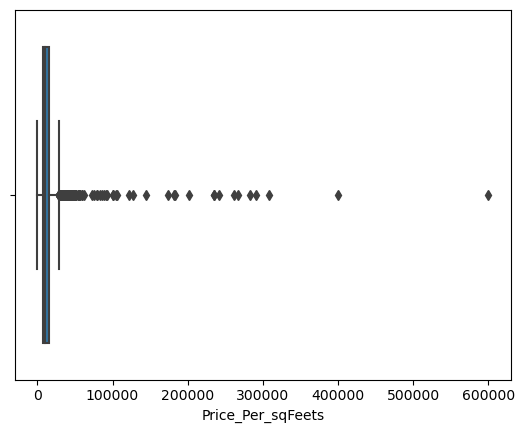

In [307]:
sns.boxplot(x=df['Price_Per_sqFeets'])

In [308]:
x = df[df['Price_Per_sqFeets'] <= 20000]
(x['area']/x['bedRoom']).quantile(0.05)

225.0

In [309]:
df[(df['area']/df['bedRoom']) < 250]

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score
142,house,vatika sovereign next sector-82 a gurgaon,sector 82,0.65,9028.0,720.0,4.0,4.0,3,6.0,Under Construction,720.00,1.0,1.0,0.0,0.0,1.0,0.0,30.0
145,house,micasa sec 68,sector 35,0.58,86567.0,67.0,2.0,2.0,3,11.0,New Property,67.00,0.0,0.0,0.0,0.0,0.0,2.0,60.0
146,house,eldeco accolade,sector 35,0.65,92857.0,70.0,3.0,3.0,3+,10.0,Relatively New,70.00,0.0,0.0,0.0,0.0,0.0,2.0,55.0
147,house,hero homes,sector 104,0.61,100000.0,61.0,3.0,3.0,3,2.0,Relatively New,61.00,0.0,0.0,0.0,0.0,0.0,2.0,93.0
148,house,shyam sadan,sector 37,0.67,88158.0,76.0,2.0,2.0,1,4.0,Relatively New,76.00,0.0,1.0,0.0,0.0,0.0,0.0,0.0
164,house,aardhya homesh,sector 67,0.66,12000.0,550.0,4.0,4.0,0,4.0,Relatively New,550.00,0.0,0.0,0.0,0.0,0.0,2.0,53.0
180,house,ss the leaf,sector 85,0.50,8333.0,600.0,3.0,5.0,3,2.0,New Property,600.00,0.0,0.0,0.0,0.0,0.0,2.0,125.0
184,house,godrej air,sector 85,0.50,11111.0,450.0,3.0,3.0,3,30.0,Under Construction,450.00,0.0,0.0,0.0,0.0,0.0,2.0,0.0
191,house,m3m capital,sector 113,0.82,9111.0,900.0,4.0,4.0,3+,11.0,Relatively New,900.00,1.0,1.0,0.0,0.0,0.0,2.0,24.0
206,flat,supertech basera,sector 79,0.36,7643.0,471.0,2.0,2.0,1,4.0,New Property,546.00,0.0,0.0,0.0,0.0,0.0,2.0,127.0


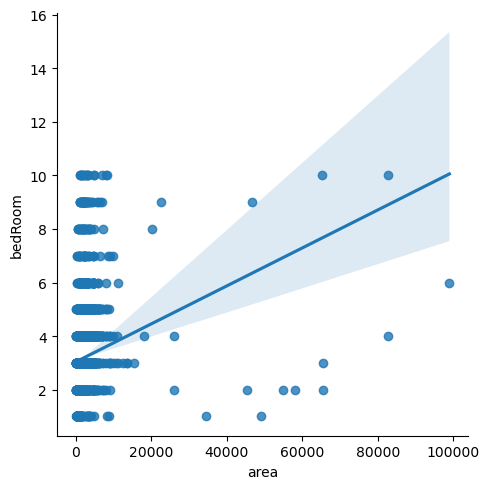

In [310]:
sns.lmplot(data=df, x='area', y='bedRoom')

In [311]:
df['area_room_ratio'] = df['area']/df['bedRoom']

In [312]:
(df[df['area_room_ratio'] < 250])['bedRoom'].value_counts()

3.0     77
2.0     55
4.0     52
5.0     32
6.0     22
9.0     16
8.0     13
7.0      9
10.0     8
Name: bedRoom, dtype: int64

In [313]:
df = df[df['area_room_ratio'] > 100]

In [314]:
outliers_df = df[(df['area_room_ratio'] < 250) & (df['bedRoom'] >3)]

In [315]:
outliers_df['floorNum']

142      6.0
164      4.0
191     11.0
220      1.0
372      3.0
376     19.0
378     10.0
379     10.0
421     11.0
438      7.0
446      2.0
449      3.0
457      4.0
494     15.0
497     10.0
549     12.0
563      6.0
589      8.0
609      1.0
646      7.0
677      6.0
678     10.0
1016     2.0
2974     3.0
2976     3.0
2983     4.0
3012     3.0
3083     3.0
3094     3.0
3096     3.0
3104     1.0
3106     2.0
3112     3.0
3113     1.0
3114     3.0
3115     1.0
3119     1.0
3121     2.0
3139     2.0
3147     3.0
3153     2.0
3164     1.0
3166     3.0
3175     3.0
3177     1.0
3181     3.0
3186     1.0
3191     2.0
3210     2.0
3227     3.0
3234     1.0
3235     2.0
3236     1.0
3243     1.0
3245     4.0
3247     2.0
3253     2.0
3254     2.0
3264     3.0
3272     4.0
3274     1.0
3276     3.0
3277     2.0
3286     3.0
3289     1.0
3291     3.0
3298     3.0
3300     4.0
3301     3.0
3310     2.0
3323     2.0
3327     4.0
3328     3.0
3329     3.0
3330     2.0
3334     3.0
3337     2.0

In [316]:
outliers_df['bedRoom'] = round(outliers_df['bedRoom']/outliers_df['floorNum'])

In [317]:
df.update(outliers_df)

In [318]:
df['area_room_ratio'] = df['area']/df['bedRoom']

In [319]:
df[(df['area_room_ratio'] < 250) & (df['bedRoom'] > 4)]

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score,area_room_ratio
3104,house,independent,sector 1,1.10,6173.0,1782.0,8.0,8.0,0,1.0,New Property,1782.0,0.0,0.0,0.0,0.0,0.0,2.0,60.0,222.750000
3113,house,independent,sector 1,0.80,6667.0,1200.0,8.0,8.0,2,1.0,Relatively New,1200.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,150.000000
3115,house,shivpuri,sector 9,2.80,12444.0,2250.0,10.0,7.0,3,1.0,Old Property,2250.0,0.0,0.0,0.0,0.0,0.0,0.0,78.0,225.000000
3119,house,independent,sector 7,1.16,11717.0,990.0,5.0,4.0,2,1.0,Old Property,122.0,0.0,0.0,0.0,0.0,0.0,2.0,78.0,198.000000
3164,house,independent,sector 5,1.65,8333.0,1980.0,9.0,9.0,0,1.0,New Property,220.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,220.000000
3177,house,independent,sector 10,2.50,13889.0,1800.0,9.0,5.0,2,1.0,Old Property,1800.0,0.0,0.0,0.0,0.0,0.0,2.0,107.0,200.000000
3186,house,"bhim nagar, sector 6",sector 6,0.85,14096.0,603.0,5.0,2.0,2,1.0,Old Property,67.0,0.0,0.0,0.0,0.0,0.0,2.0,145.0,120.600000
3243,house,independent,sector 37,1.10,10000.0,1100.0,5.0,4.0,2,1.0,Relatively New,1100.0,0.0,0.0,0.0,0.0,0.0,2.0,174.0,220.000000
3274,house,independent,sector 67,0.65,6500.0,1000.0,6.0,2.0,3,1.0,Relatively New,1111.0,0.0,0.0,0.0,0.0,0.0,2.0,72.0,166.666667
3289,house,independent,sector 105,1.10,12222.0,900.0,6.0,4.0,1,1.0,Relatively New,1000.0,0.0,0.0,0.0,0.0,0.0,2.0,98.0,150.000000


In [320]:
df[(df['area_room_ratio'] < 250) & (df['bedRoom'] > 4)].shape

(13, 20)

In [321]:
df = df[~((df['area_room_ratio'] < 250) & (df['bedRoom'] > 4))]

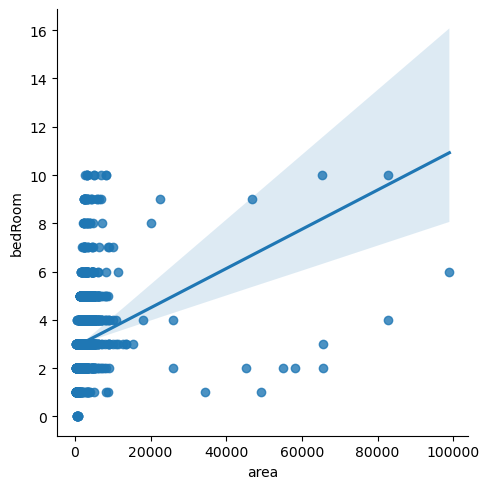

In [322]:
sns.lmplot(data=df, x='area', y='bedRoom')

In [323]:
df.shape

(3730, 20)

In [324]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3730 entries, 0 to 3878
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Property_type      3730 non-null   object 
 1   society            3730 non-null   object 
 2   sector             3730 non-null   object 
 3   price              3730 non-null   float64
 4   Price_Per_sqFeets  3730 non-null   float64
 5   area               3730 non-null   float64
 6   bedRoom            3730 non-null   float64
 7   bathroom           3730 non-null   float64
 8   balcony            3730 non-null   object 
 9   floorNum           3730 non-null   float64
 10  agePossession      3730 non-null   object 
 11  built_up_area      3730 non-null   float64
 12  servant room       3730 non-null   float64
 13  study room         3730 non-null   float64
 14  others             3730 non-null   float64
 15  pooja room         3730 non-null   float64
 16  store room         3730 

In [325]:
df.duplicated().sum()

1

In [326]:
df.drop_duplicates(inplace=True)

In [327]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score,area_room_ratio
0,house,maa bhagwati residency,sector 7,5.25,20115.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0,1305.0
1,house,apna enclave,sector 5,5.70,105751.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,269.5
2,house,tulsiani easy in homes,sector 35,2.10,38251.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0,274.5
3,house,smart world orchard,sector 61,5.00,43066.0,1161.0,2.0,2.0,2,2.0,New Property,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0,580.5
4,house,parkwood westend,sector 92,3.00,53763.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,279.0


### Property_type

<Axes: >

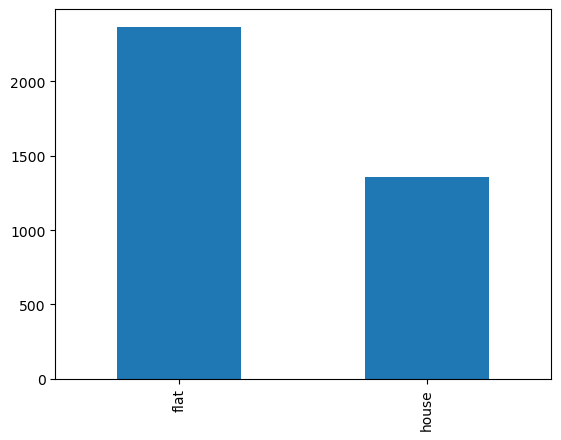

In [328]:
df['Property_type'].value_counts().plot(kind='bar')

Observations:
- Flats are in majority(75 percent) and there are less number of houses(~25 percent)
- No missing values

### Society

In [329]:
df['society'].value_counts().shape

(680,)

In [330]:
df['society'].value_counts()

independent                                          469
tulip violet                                          74
ss the leaf                                           73
shapoorji pallonji joyville gurugram                  44
dlf new town heights                                  41
signature global park                                 36
shree vardhman victoria                               35
smart world gems                                      33
emaar mgf emerald floors premier                      32
smart world orchard                                   32
paras dews                                            31
dlf the ultima                                        31
m3m woodshire                                         30
shree vardhman flora                                  29
dlf regal gardens                                     29
la vida by tata housing                               28
signature global solera                               27
godrej nature plus             

In [331]:
df[df['society'] != 'independent']['society'].value_counts(normalize=True).cumsum().head(75)

tulip violet                            0.022699
ss the leaf                             0.045092
shapoorji pallonji joyville gurugram    0.058589
dlf new town heights                    0.071166
signature global park                   0.082209
shree vardhman victoria                 0.092945
smart world gems                        0.103067
smart world orchard                     0.112883
emaar mgf emerald floors premier        0.122699
paras dews                              0.132209
dlf the ultima                          0.141718
m3m woodshire                           0.150920
shree vardhman flora                    0.159816
dlf regal gardens                       0.168712
la vida by tata housing                 0.177301
signature global solera                 0.185583
godrej nature plus                      0.193865
bptp terra                              0.201534
vatika gurgaon                          0.208896
tata primanti                           0.216258
emaar gurgaon greens

In [332]:
society_count = df['society'].value_counts()

#Frequency distribution for societies

frequency_bins = {
    'Very High (>100)':(society_count >100).sum(),
    'High (50-100)': (society_count>=50).sum(),
    'Average(10-49)': (society_count>=10).sum(),
    'Low (2-9)':(society_count<10).sum(),
    'Very Low (1)':(society_count == 1).sum()
}

In [333]:
frequency_bins

{'Very High (>100)': 1,
 'High (50-100)': 3,
 'Average(10-49)': 99,
 'Low (2-9)': 581,
 'Very Low (1)': 293}

<Axes: >

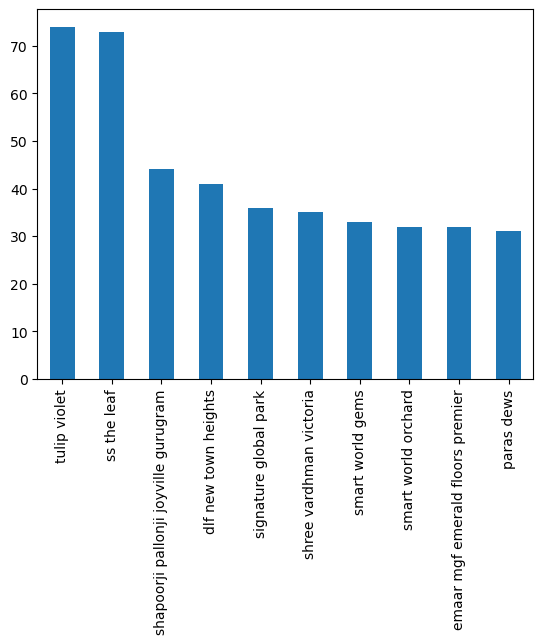

In [334]:
#Top 10 socities
df[df['society'] != 'independent']['society'].value_counts().head(10).plot(kind='bar')

Observations:
- Around 13% properties comes under independent tag
- There are 680 societies
- The top 75 societies have 50% of the properties and the rest of percent of the properties comes under the remaining 600 societies
    - Very High(>100): Only 1 society has more than 100 entries
    - High (50-100): 3 societies have 50-100 entries
    - Average(10-49): 95 societies have 10-49 entries
    - Low(2-9): 607 societies have 2 to 9 entries
    - Very Low (1): 324 socities have only 1 entries


### Sector

In [335]:
# unique Sectors
df['sector'].value_counts().shape

(98,)

<Axes: >

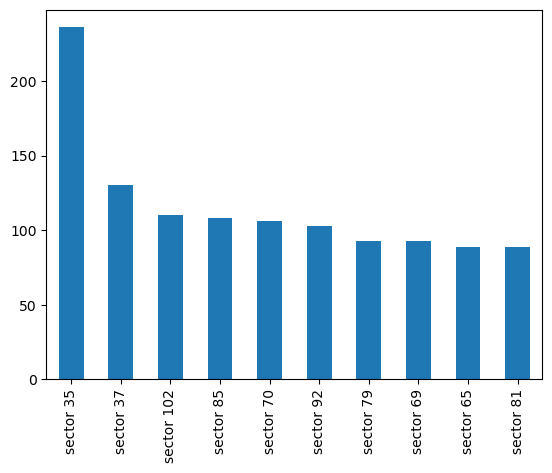

In [336]:
# Top 10 Sectors
df['sector'].value_counts().head(10).plot(kind='bar')

In [337]:
# Frequency distribution for sectors

sector_counts = df['sector'].value_counts()

sector_frequency_bins = {
    'Very High (>100)': (sector_counts > 100).sum(),
    'High (50-100)': ((sector_counts >= 50) & (sector_counts <= 100)).sum(),
    'Average (10-49)':((sector_counts >= 10) & (sector_counts < 50)).sum(),
    'Low (2-9)': ((sector_counts >=2) & (sector_counts < 10)).sum(),
    'Very Low (1)': (sector_counts == 1).sum()
}

In [338]:
sector_frequency_bins

{'Very High (>100)': 6,
 'High (50-100)': 21,
 'Average (10-49)': 53,
 'Low (2-9)': 17,
 'Very Low (1)': 1}

Observations:
- There are total of 155 sectors in the dataset
- Frequency distribution of the sector:
- Very High (>100): 6 sectors have more than 100 entries
- High (50-100) : 21 sectors have entries between 50 to 100
- Average (10-49): 53 sectors have entries between 10 to 49
- Low (2-9): 17 sectors have entries between 2 to 9
- Very Low (1): 1 sectors have only one entry

### Price

In [339]:
df['price'].isnull().sum()

0

In [340]:
df['price'].describe()

count    3729.000000
mean        2.978839
std         3.494214
min         0.070000
25%         0.950000
50%         1.640000
75%         3.500000
max        31.500000
Name: price, dtype: float64

<Axes: xlabel='price', ylabel='Count'>

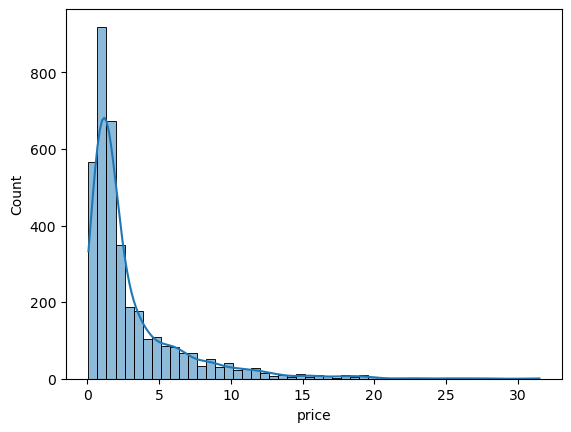

In [341]:
sns.histplot(df['price'], kde=True, bins=50)

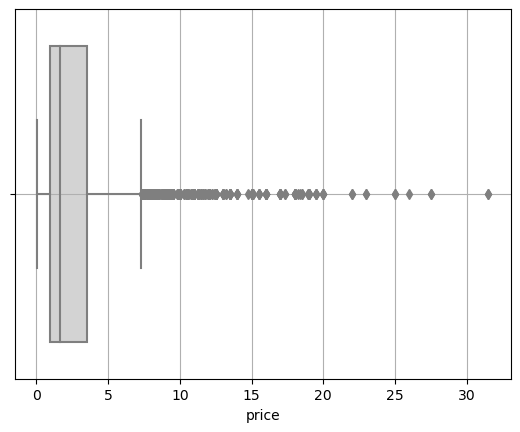

In [342]:
sns.boxplot(x=df['price'], color='lightgrey')
plt.grid()

### Descriptive Statistics:

- Count There are 3729 non-missing price listing
- Mean Price: The average price approximately 2.97 crores.
- Median Price: The median (or 50th percentile) price is 1.64 crores.
- Standard Deviation:The prices have a standard deviation of 3.49, indicating data variability in the prices.
- Range: Prices range from a minimum of 0.07 crores to a maximum of 31.5 crores.
- IQR: The Interquartile range (difference between 75th and 25th percentile) is from 0.95 crores to 3.5 crores.

### Visualizations:

- Distribution: The histogram indicates the most properties are priced in the lower range (below 5 crores), with a few proparties going beyond 10 crores.
- Box Plot: The box plot showcases the spread of the data and potential outliers. Properties priced above approximately 10 crores might be considered outliers as they lie beyond the upper whisker of the box plot.

In [343]:
# Skewness and Kurtosis
skewness = df['price'].skew()
kurtosis = df['price'].kurt()

print(skewness, kurtosis)

2.712753522040762 9.827155734628636


<b>Skewness</b>:The price distribution has a skewness of approximately 2.71, indicating a positive skew. This means that the distribution tail is skewed to right, which aligns with our observation from the histogram where most properties have prices on the lower end  with a few high-priced properties.

<b>Kurtosis</b>: The kurtosis value is approximately 9.82. A kurtosis value greater than 3 indicates distribution with heavier tails and more outliers compared to a normal distribution.

In [344]:
# Quantile Analysis
quantiles = df['price'].quantile([0.01, 0.05, 0.95, 0.99])

quantiles

0.01     0.250
0.05     0.370
0.95    10.300
0.99    17.804
Name: price, dtype: float64

### Quantile Analysis:

- 1% Quantile: Only 1% of properties are priced below 0.25 crores.
- 5% Quantile: 5% of properties are priced below 0.37 crores.
- 95% Quantile: 95% of properties are priced below 10.3 crores.
- 99% Quantile: 99% of properties are priced below 17.80 crores, indicating that very few properties are priced above this value.

In [349]:
# Identify potential outliers using IQR method

Q1 = df['price'].describe()['25%']
Q3 = df['price'].describe()['75%']

IQR = Q3-Q1
IQR

2.55

In [350]:
lower_bound = Q1 - 1.5*IQR
upper_bound = Q3 + 1.5*IQR

print(lower_bound, upper_bound)

-2.875 7.324999999999999


In [351]:
outliers = df[(df['price'] <lower_bound) | (df['price'] > upper_bound)]
outliers.shape

(369, 20)

In [352]:
outliers['price'].describe()

count    369.000000
mean      11.557940
std        4.117778
min        7.350000
25%        8.500000
50%       10.450000
75%       13.000000
max       31.500000
Name: price, dtype: float64

### Outliers Analysis (using IQR method):

- Based on the IQR method, there are 369 properties considered as outliers.
- These outliers have an average price of approximately 11.56 crores.
- The range for these outliers is from 7.35 crores to 31.5 crores

<Axes: >

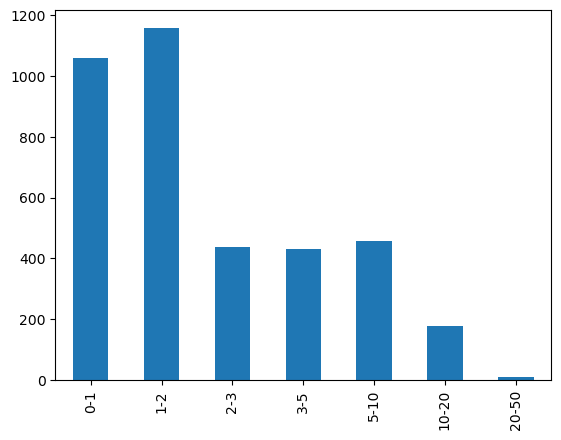

In [353]:
# price binning
bins = [0, 1, 2, 3, 5, 10, 20, 50]
bin_labels = ['0-1', '1-2', '2-3', '3-5', '5-10', '10-20', '20-50']
pd.cut(df['price'],bins=bins, labels=bin_labels, right=True).value_counts().sort_index().plot(kind='bar')

- The majority of properties are priced in the '1-2 crores' and '2-3 crores' ranges
- There's a significant drop in the number of properties priced above '5 crores'

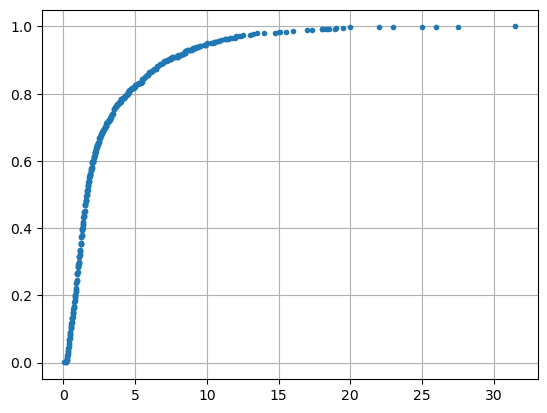

In [354]:
# ecdf plot
ecdf = df['price'].value_counts().sort_index().cumsum()/len(df['price'])
plt.plot(ecdf.index, ecdf, marker='.', linestyle='none')
plt.grid()

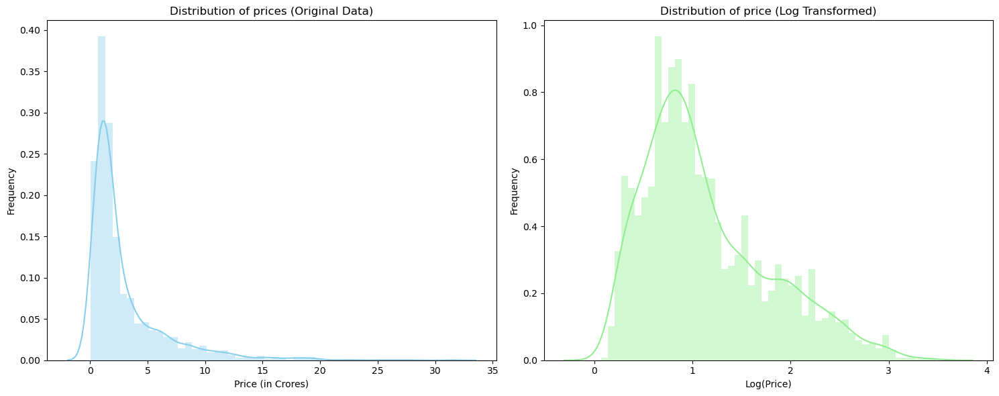

In [355]:
plt.figure(figsize=(15, 6))

# Distribution plot without log transformation
plt.subplot(1, 2, 1)
sns.distplot(df['price'], kde=True, bins=50,color='skyblue')
plt.title('Distribution of prices (Original Data)')
plt.xlabel('Price (in Crores)')
plt.ylabel('Frequency')

# Distribution plot with log transformation
plt.subplot(1,2,2)
sns.distplot(np.log1p(df['price']), kde=True, bins=50, color='lightgreen')
plt.title('Distribution of price (Log Transformed)')
plt.xlabel('Log(Price)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

np.log1p(x). This function computes the natural logarithm of 1+x. It's designed to provide more accurate results for values of x that are very close to zero.

Using np.log1p helps in transforming the price column while ensuring the any any value (including zero, if present) is handed appropriately.When we need to reverse the transformation, we can use np.expm1 which is computes e^x-1.

In [356]:
skewness = np.log1p(df['price']).skew()
kurtosis = np.log1p(df['price']).kurt()

print(skewness, kurtosis)

0.8827458394386718 0.16056772473096625


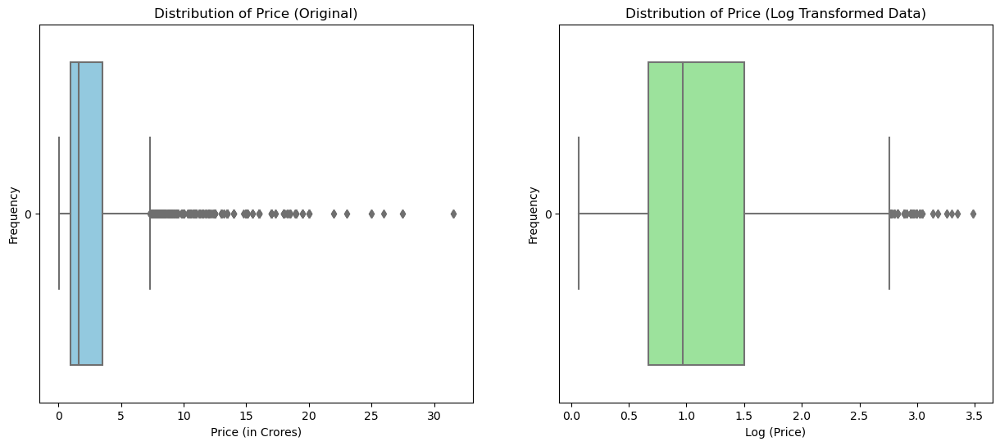

In [357]:
## Box Plot with log transformed data

plt.figure(figsize=(15, 6))

# Distribution plot without log transformation
plt.subplot(1, 2, 1)
sns.boxplot(df['price'], color='skyblue',orient='h')
plt.title('Distribution of Price (Original)')
plt.xlabel('Price (in Crores)')
plt.ylabel('Frequency')

# Distribution plot with Log transformation
plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(df['price']), color='lightgreen',orient='h')
plt.title('Distribution of Price (Log Transformed Data)')
plt.xlabel('Log (Price)')
plt.ylabel('Frequency')

# plt.tight_layout()
plt.show()

### Price_per_sqFeets

In [359]:
df['Price_Per_sqFeets'].describe()

count      3729.000000
mean      13205.694288
std       11460.450366
min          53.000000
25%        6983.000000
50%        9524.000000
75%       15556.000000
max      261194.000000
Name: Price_Per_sqFeets, dtype: float64

<Axes: xlabel='Price_Per_sqFeets', ylabel='Count'>

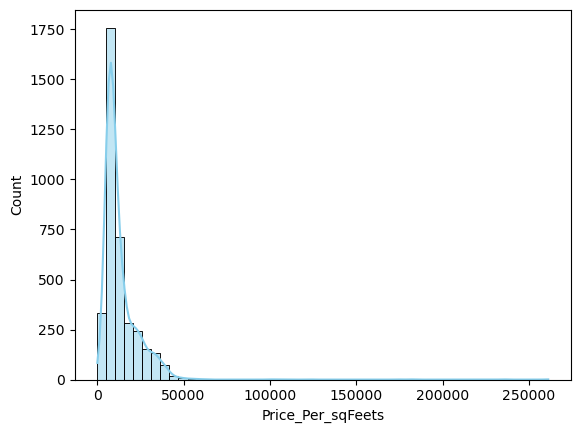

In [360]:
sns.histplot(df['Price_Per_sqFeets'], bins=50, color='skyblue', kde=True)

Most properties have a price_per_sqFeets ranging between approximately 0 and 40,000. There is a significant concentration in the lower range, with few properties having exceptionally high price_per_sqfeets.

<Axes: >

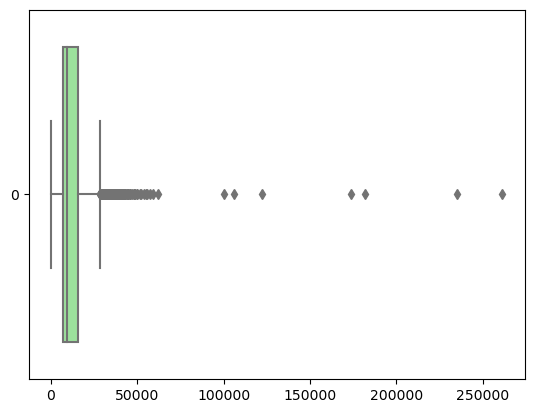

In [362]:
sns.boxplot(df['Price_Per_sqFeets'], color='lightgreen', orient='h')

The box plot clearly shows several outliers, especially on the higher side. The interquartile range (IQR) is relativaly compact, but there are many data point beyond the 'whiskers' of the box plot, indicating potential outliers

## bedRoom

<Axes: >

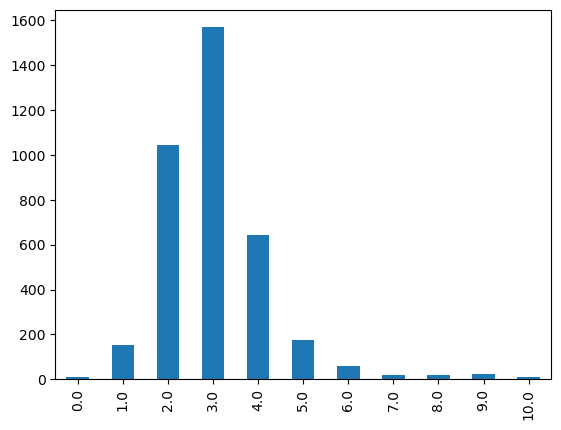

In [363]:
df['bedRoom'].value_counts().sort_index().plot(kind='bar')

<Axes: ylabel='bedRoom'>

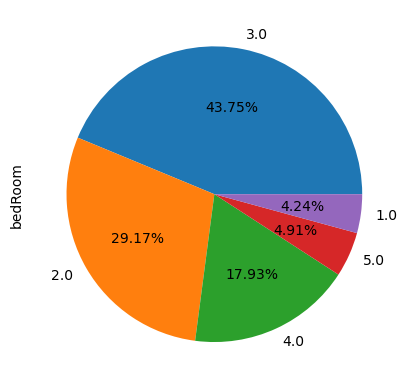

In [364]:
df['bedRoom'].value_counts(normalize=True).head().plot(kind='pie',autopct='%0.2f%%')

### Bathroom

In [365]:
df['bathroom'].value_counts()

2.0     1112
3.0     1108
4.0      824
5.0      292
1.0      164
6.0      117
7.0       39
9.0       39
8.0       21
10.0      10
11.0       2
12.0       1
Name: bathroom, dtype: int64

<Axes: >

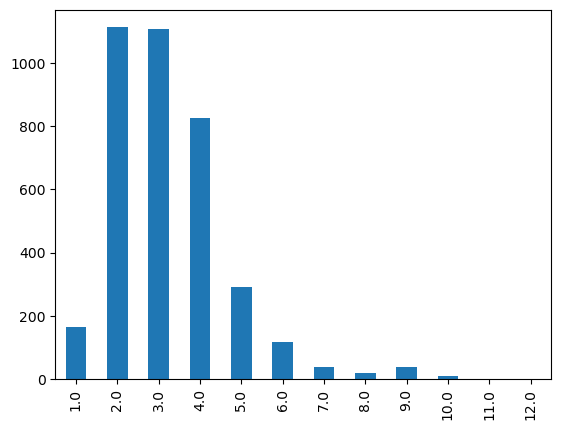

In [366]:
df['bathroom'].value_counts().sort_index().plot(kind='bar')

<Axes: ylabel='bathroom'>

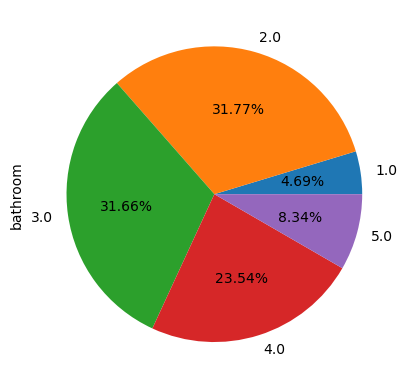

In [367]:
df['bathroom'].value_counts(normalize=True).sort_index().head().plot(kind='pie',autopct='%0.2f%%')

In [368]:
df.head()

,Property_type,society,sector,price,Price_Per_sqFeets,area,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,servant room,study room,others,pooja room,store room,furnishing_type,luxury_score,area_room_ratio
0,house,maa bhagwati residency,sector 7,5.25,20115.0,2610.0,2.0,2.0,1,4.0,Relatively New,2610.0,0.0,0.0,0.0,0.0,0.0,2.0,39.0,1305.0
1,house,apna enclave,sector 5,5.70,105751.0,539.0,2.0,2.0,1,1.0,Old Property,539.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,269.5
2,house,tulsiani easy in homes,sector 35,2.10,38251.0,549.0,2.0,2.0,3,12.0,New Property,549.0,0.0,0.0,0.0,0.0,0.0,2.0,64.0,274.5
3,house,smart world orchard,sector 61,5.00,43066.0,1161.0,2.0,2.0,2,2.0,New Property,1161.0,0.0,1.0,0.0,0.0,0.0,2.0,100.0,580.5
4,house,parkwood westend,sector 92,3.00,53763.0,558.0,2.0,2.0,3,5.0,Under Construction,558.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,279.0


In [369]:
df['balcony'].value_counts()

3+    1133
3     1090
2      926
1      396
0      184
Name: balcony, dtype: int64

<Axes: >

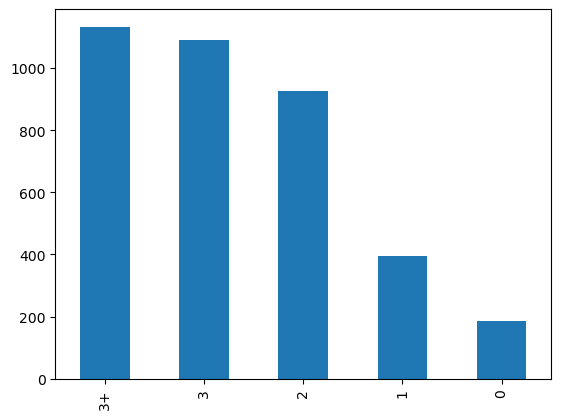

In [370]:
df['balcony'].value_counts().head().plot(kind='bar')

<Axes: ylabel='balcony'>

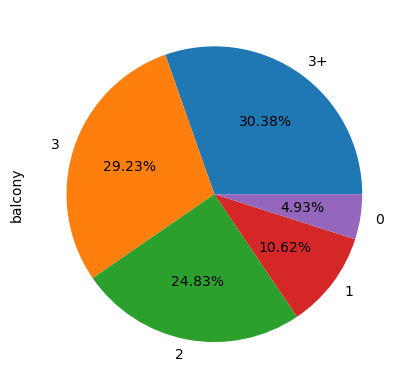

In [371]:
df['balcony'].value_counts(normalize=True).plot(kind='pie', autopct= '%0.2f%%')

### floornum

In [372]:
df['floorNum'].describe()

count    3729.000000
mean        6.796192
std         5.983102
min         0.000000
25%         2.000000
50%         5.000000
75%        10.000000
max        51.000000
Name: floorNum, dtype: float64

<Axes: >

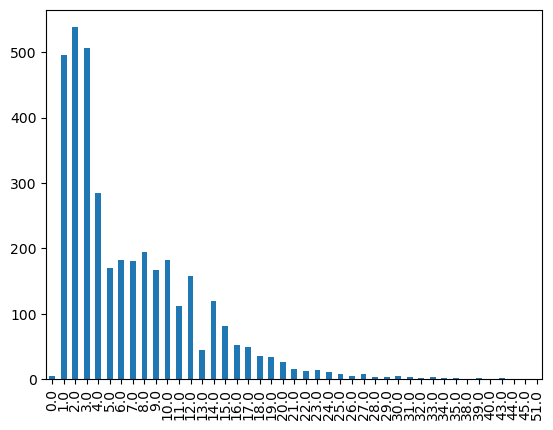

In [373]:
df['floorNum'].value_counts().sort_index().plot(kind='bar')

### Observations:

- The majority of the properties lie between the ground floor (0) and the 25th floor
- Floors 1 to 4 are particularly common, with the 3rd floor being the most frequent.
- There are a few proparties located at higher floors, but their frequency is much lower
- The box plot reveal that the majority of the properties are concertrated around the lower floors. The interquartile range (IQR) lies between approximately the 2nd and 10th floors.
- Data points beyond the 'whiskers' of the box plot, especially on the higher side, indicate potential outliers.

### Facing

In [375]:
df['facing'].value_counts()

KeyError: 'facing'